In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_hub as hub
import matplotlib.pylab as plt
from tensorflow.keras.applications.vgg16 import preprocess_input
import os
import cv2

In [ ]:
!unzip "/content/Image-Cropped-Aug-Seg.zip"

Streaming output truncated to the last 5000 lines.
  inflating: Image-Cropped/test/images/u_088_jpg.rf.0309c82018b38c871431e6be6d9007e8.jpg  
  inflating: Image-Cropped/test/images/u_091_jpg.rf.1018527326e8833c577f39838095c727.jpg  
  inflating: Image-Cropped/test/images/u_093_jpg.rf.74c96da75355564367dc4b54a3465089.jpg  
  inflating: Image-Cropped/test/images/v_013_jpg.rf.afba04b071a0bf715439c706fb59f15d.jpg  
  inflating: Image-Cropped/test/images/v_014_jpg.rf.cd944582be3ddfc61afbf655347ed2eb.jpg  
  inflating: Image-Cropped/test/images/v_025_jpg.rf.e68776b65d4107cbc20841925fdd904c.jpg  
  inflating: Image-Cropped/test/images/v_036_jpg.rf.7dcd4e86ce0f85fdab443312882af6bd.jpg  
  inflating: Image-Cropped/test/images/v_039_jpg.rf.a0a001bd3a76b3cf58f283a3460cd822.jpg  
  inflating: Image-Cropped/test/images/v_044_jpg.rf.c4585d9d03cf51381eeba0aa3cb3aac9.jpg  
  inflating: Image-Cropped/test/images/v_066_jpg.rf.17a05801215138c67b67eaa21c1359fb.jpg  
  inflating: Image-Cropped/test/images/

In [ ]:
import os
from google.colab.patches import cv2_imshow
for name in os.listdir("/content/Image-Cropped/train/images"):
    if name[0] == 'b':
        cv2_imshow(cv2.imread(os.path.join("/content/Image-Cropped/train/images", name)))

In [ ]:
train_data_dir = '/content/Image-Cropped/train/images'
validation_dir = '/content/Image-Cropped/valid/images'
train_data_dir1 = 'ASLAlphabet/asl_alphabet_train/asl_alphabet_train'
val_data_dir1 = 'ASLAlphabet/asl_alphabet_test/asl_alphabet_test'

In [ ]:
path_to_train_images = '/content/Image-Cropped/train/images'
path_to_train_labels = '/content/Image-Cropped/train/labels'
path_to_test_images = '/content/Image-Cropped/test/images'
path_to_test_labels = '/content/Image-Cropped/test/labels'
path_to_val_images = '/content/Image-Cropped/valid/images'
path_to_val_labels = '/content/Image-Cropped/valid/labels'

In [ ]:
for path in [path_to_train_images, path_to_test_images, path_to_val_images]:
    for name in os.listdir(path):
        img = cv2.imread(os.path.join(path, name))
        # img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        b, g, r = cv2.split(img)
        sobel_x_b = cv2.Sobel(b, cv2.CV_64F, 1, 0)
        sobel_y_b = cv2.Sobel(b, cv2.CV_64F, 0, 1)
        sobel_x_g = cv2.Sobel(g, cv2.CV_64F, 1, 0)
        sobel_y_g = cv2.Sobel(g, cv2.CV_64F, 0, 1)
        sobel_x_r = cv2.Sobel(r, cv2.CV_64F, 1, 0)
        sobel_y_r = cv2.Sobel(r, cv2.CV_64F, 0, 1)
        gradient_magnitude_b = np.sqrt(sobel_x_b**2 + sobel_y_b**2).astype(np.uint8)
        gradient_magnitude_g = np.sqrt(sobel_x_g**2 + sobel_y_g**2).astype(np.uint8)
        gradient_magnitude_r = np.sqrt(sobel_x_r**2 + sobel_y_r**2).astype(np.uint8)

        gradient_image = cv2.add(gradient_magnitude_b, gradient_magnitude_g)
        gradient_image = cv2.add(gradient_image, gradient_magnitude_r)
        cv2.imwrite(os.path.join(path, name), gradient_image)

In [ ]:
# IMG_SIZE = (224,224)
# IMG_SHAPE = IMG_SIZE + (3,)
# batch_size = 16

# train_datagen = ImageDataGenerator(
#     rescale=1.0 / 255.0,
#     fill_mode="constant",
#     cval=0
# )

# validation_datagen = ImageDataGenerator(rescale=1.0/255)

# train_generator = train_datagen.flow_from_directory(
#     train_data_dir,
#     batch_size=batch_size,
#     target_size=IMG_SIZE,
#     class_mode="sparse",
#     subset='training'
# )

# validation_generator = train_datagen.flow_from_directory(
#     train_data_dir,
#     batch_size=batch_size,
#     target_size=IMG_SIZE,
#     class_mode="sparse",
#     subset='validation'
# )
# labels = (validation_generator.class_indices)
# labels = dict((v,k) for k,v in labels.items())
# print(labels)

test_features = []
test_labels = []

size = (224, 224)


def data_preprocessing(folder_features, folder_labels, features, labels):
    features_list = os.listdir(folder_features) #files now  contains all the images found in'folder'
    labels_list = os.listdir(folder_labels)
    features_list.sort()
    labels_list.sort()

    # for feature, label in zip(features_list, labels_list):
    for feature in features_list:
      feature_path = folder_features + '/' + feature
    #   label_path = folder_labels + '/' + label
      label_class = str(ord(feature[0]) - ord('a'))

      print(f'features: {feature_path}')
    #   print(f'labels: {label}')

      img = cv2.imread(feature_path)
      img = cv2.resize(img, dsize = size)
    #   label_file = open(label_path)
    #   label_class = label_file.readline().split()[0]

      print(f"label class: {label_class}")

      features.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
      labels.append(label_class)

In [ ]:
train_features = []
train_labels = []

data_preprocessing(path_to_train_images, path_to_train_labels, train_features, train_labels)

val_features = []
val_labels = []

data_preprocessing(path_to_val_images, path_to_val_labels, val_features, val_labels)

Streaming output truncated to the last 5000 lines.
features: /content/Image-Cropped/train/images/q_053_jpg.rf.58e1906d5817e09c6eb520603fcfe901.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_053_jpg.rf.bdf88fd99dd5807f07fc9f3c1928a557.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_053_jpg.rf.c0cfc9e2b63a4c6fa711661c0ff68078.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_054_jpg.rf.2d44591e9b293bc3de0f49b11a0fb0d0.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_054_jpg.rf.67f6d3c75f83796f6f7039707d805702.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_054_jpg.rf.a3cfa327aabbd66cb8d760a86b30f354.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_057_jpg.rf.62ad0a433c497243f435011b9d4861f3.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_057_jpg.rf.9537b99237b2492ac7c0309a04344622.jpg
label class: 16
features: /content/Image-Cropped/train/images/q_057_j

In [ ]:
train_features = np.array(train_features).astype(np.float32)
train_labels = np.array(train_labels).astype(np.float32)
train_labels = to_categorical(train_labels)
train_features = train_features/255

val_features = np.array(val_features).astype(np.float32)
val_labels = np.array(val_labels).astype(np.float32)
val_labels = to_categorical(val_labels)
val_features = val_features/255

In [ ]:
mobilenet_v2 = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
resnet_v2_101 = "https://tfhub.dev/google/imagenet/resnet_v2_101/feature_vector/5"
IMG_SIZE = (224,224)
IMG_SHAPE = IMG_SIZE + (3,)
# base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')
base_model = tf.keras.applications.ResNet101V2(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')
# base_model = tf.keras.applications.VGG16(weights="imagenet", include_top=False, input_shape=IMG_SHAPE)
base_model.trainable = False

neural_net = tf.keras.Sequential([
  base_model,
  tf.keras.layers.GlobalAveragePooling2D(),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(26,activation='softmax')
])


neural_net.summary()

171317808/171317808 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101v2 (Functional)    (None, 7, 7, 2048)        42626560  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 26)                53274     
                                                                 
Total params: 42679834 (162.81 MB)
Trainable params: 53274 (208.10 KB)
Non-trainable params: 42626560 (162.61 MB)
_________________________________________________________________


In [ ]:
neural_net.compile(
  optimizer='adam',
#   loss='sparse_categorical_crossentropy',
  loss='categorical_crossentropy',
  metrics=['acc'])

# callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

callback = EarlyStopping(monitor='val_acc', mode='max', patience=10,  restore_best_weights=True)
# Train the model

In [ ]:
# from tensorflow.keras.models import load_model

# neural_net = load_model('mobilenet_seg.h5')
history = neural_net.fit(train_features, train_labels, epochs=100, batch_size=16, callbacks=[callback], validation_data=(val_features, val_labels))
neural_net.save('resnet101v2_seg_gray.h5')

Epoch 1/100
342/342 [==============================] - 56s 118ms/step - loss: 1.2754 - acc: 0.6381 - val_loss: 0.5188 - val_acc: 0.8692
Epoch 2/100
342/342 [==============================] - 33s 95ms/step - loss: 0.4717 - acc: 0.8672 - val_loss: 0.3171 - val_acc: 0.9077
Epoch 3/100
342/342 [==============================] - 35s 103ms/step - loss: 0.2945 - acc: 0.9187 - val_loss: 0.2654 - val_acc: 0.9231
Epoch 4/100
342/342 [==============================] - 35s 104ms/step - loss: 0.2306 - acc: 0.9399 - val_loss: 0.2269 - val_acc: 0.9481
Epoch 5/100
342/342 [==============================] - 35s 103ms/step - loss: 0.1742 - acc: 0.9557 - val_loss: 0.2216 - val_acc: 0.9346
Epoch 6/100
342/342 [==============================] - 35s 104ms/step - loss: 0.1534 - acc: 0.9573 - val_loss: 0.2095 - val_acc: 0.9481
Epoch 7/100
342/342 [==============================] - 33s 97ms/step - loss: 0.1227 - acc: 0.9672 - val_loss: 0.2077 - val_acc: 0.9519
Epoch 8/100
342/342 [=============================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
test_features = []
test_labels = []
data_preprocessing(path_to_test_images, path_to_test_labels, test_features, test_labels)

test_features = np.array(test_features).astype(np.float32)
test_labels = np.array(test_labels).astype(np.float32)
test_labels = to_categorical(test_labels)
test_features = test_features/255

features: /content/Image-Cropped/test/images/a_005_jpg.rf.eb02536037509d03c23831b4e94954c6.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_019_jpg.rf.fe549afe0ef9178704ef1764f9fd011e.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_026_jpg.rf.761ff76d8278b92dd3940f0b0ead9767.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_032_jpg.rf.81978b5dfbb7eeb234d3200cd71c13e8.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_058_jpg.rf.42002829fc94f1ad04b2683546da9a7b.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_061_jpg.rf.de99b1613d3c2147bc44e3497008a7e0.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_064_jpg.rf.59d6e397e917c069abe6b549387b477b.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_084_jpg.rf.93f76951e5d7cb560a30ccca8111a92e.jpg
label class: 0
features: /content/Image-Cropped/test/images/a_090_jpg.rf.a4ce1b972e113be0c76a606d36d66a89.jpg
label class: 0
features: 

In [ ]:
print(test_features[0].shape)

(224, 224, 3)


In [ ]:
print(test_labels[20])

[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]


1/1 [==============================] - 2s 2s/step


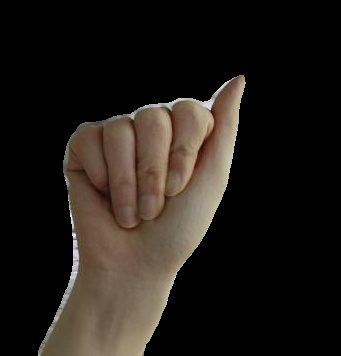

A
1/1 [==============================] - 0s 333ms/step


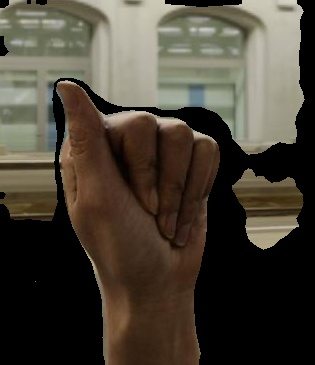

I
1/1 [==============================] - 0s 339ms/step


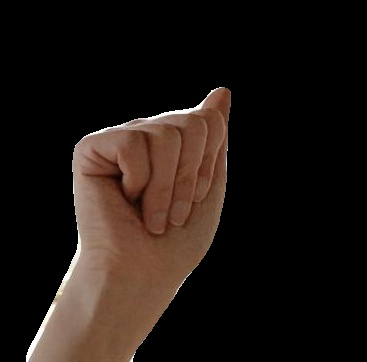

A
1/1 [==============================] - 0s 331ms/step


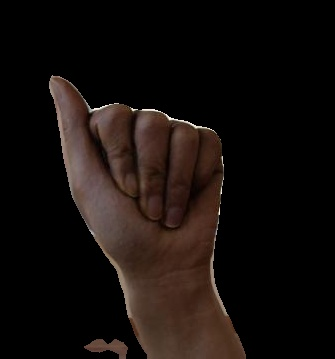

A
1/1 [==============================] - 0s 325ms/step


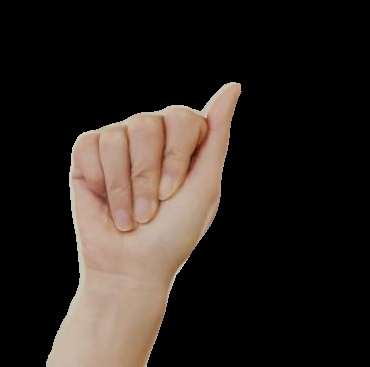

A
1/1 [==============================] - 0s 363ms/step


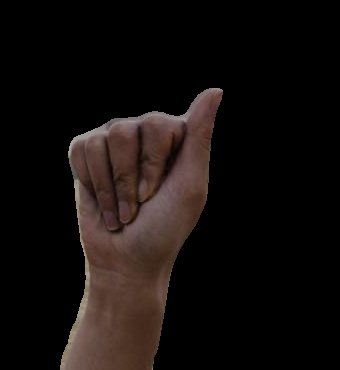

A
1/1 [==============================] - 1s 563ms/step


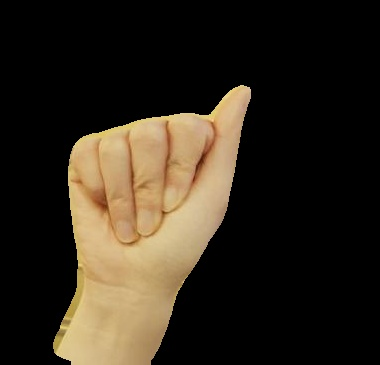

A
1/1 [==============================] - 1s 571ms/step


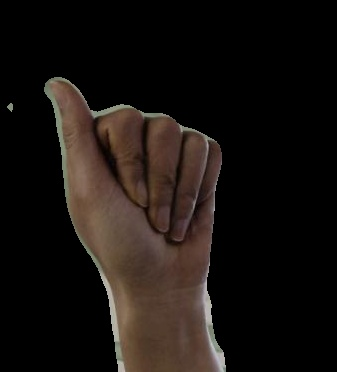

A
1/1 [==============================] - 1s 588ms/step


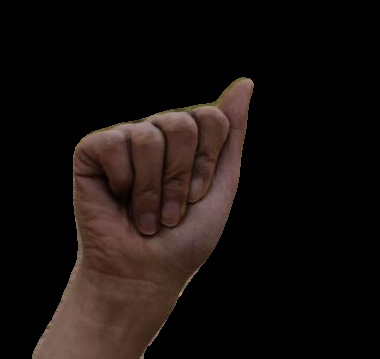

A
1/1 [==============================] - 1s 567ms/step


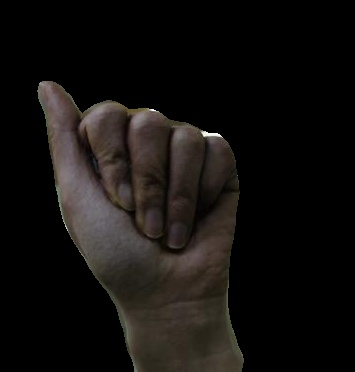

A
1/1 [==============================] - 0s 326ms/step


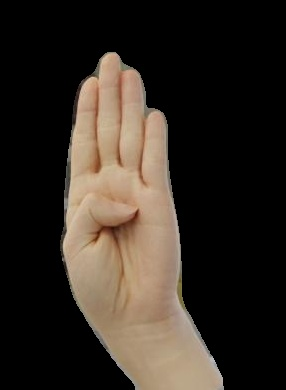

B
1/1 [==============================] - 0s 352ms/step


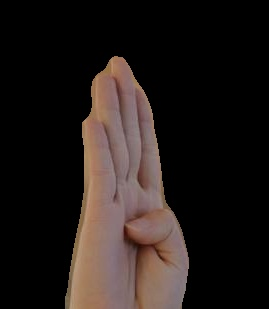

B
1/1 [==============================] - 1s 503ms/step


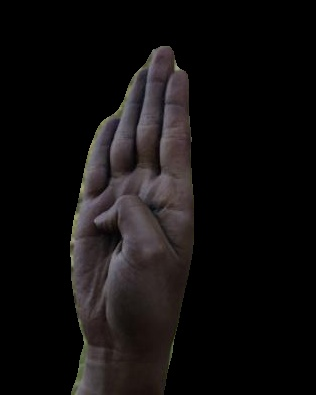

B
1/1 [==============================] - 1s 580ms/step


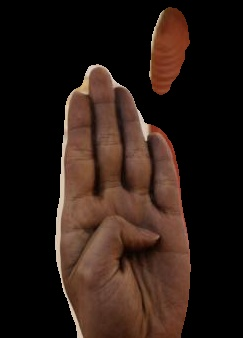

B
1/1 [==============================] - 1s 558ms/step


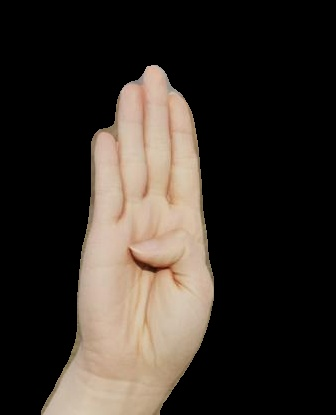

B
1/1 [==============================] - 1s 564ms/step


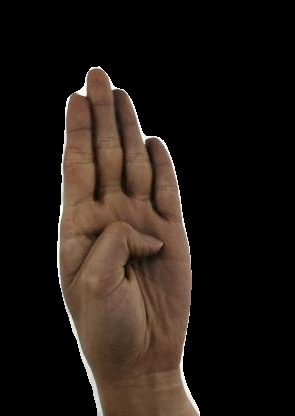

B
1/1 [==============================] - 1s 572ms/step


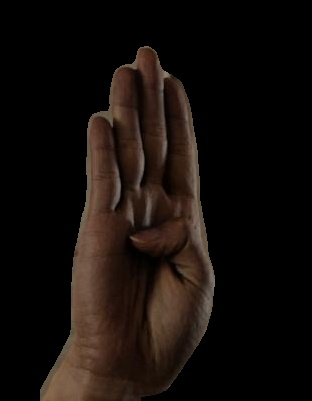

B
1/1 [==============================] - 1s 537ms/step


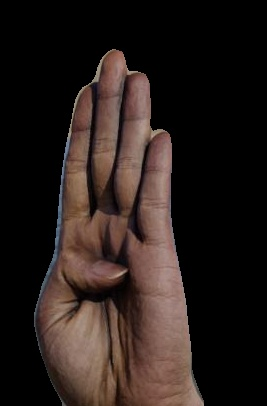

B
1/1 [==============================] - 1s 548ms/step


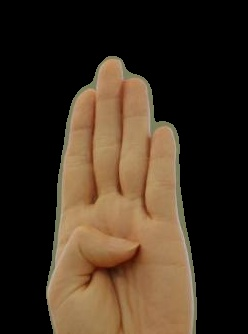

B
1/1 [==============================] - 0s 365ms/step


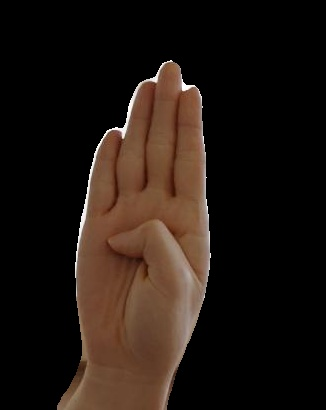

B
1/1 [==============================] - 0s 341ms/step


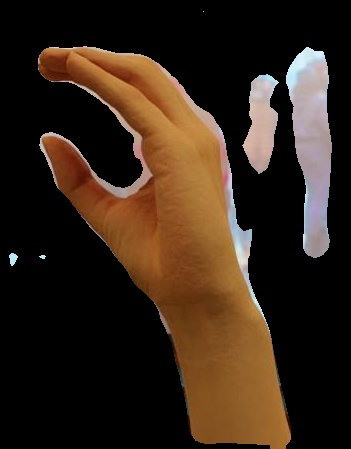

C
1/1 [==============================] - 0s 357ms/step


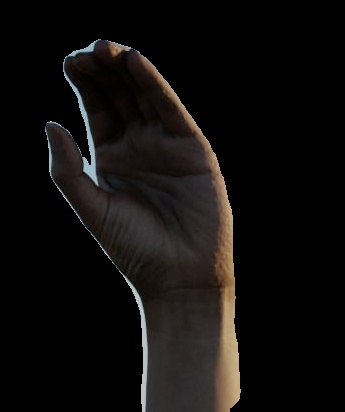

C
1/1 [==============================] - 0s 342ms/step


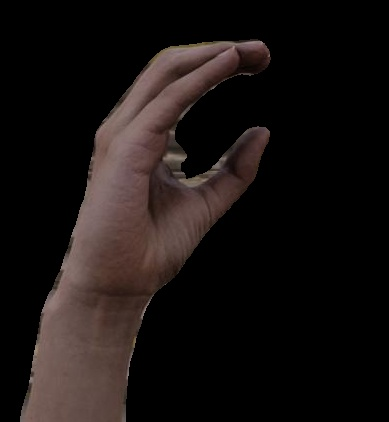

C
1/1 [==============================] - 0s 357ms/step


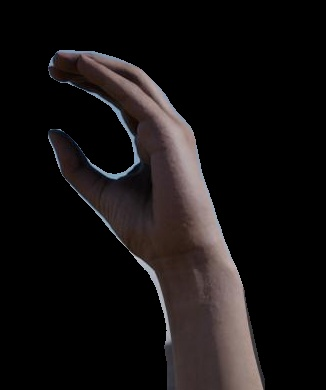

C
1/1 [==============================] - 0s 357ms/step


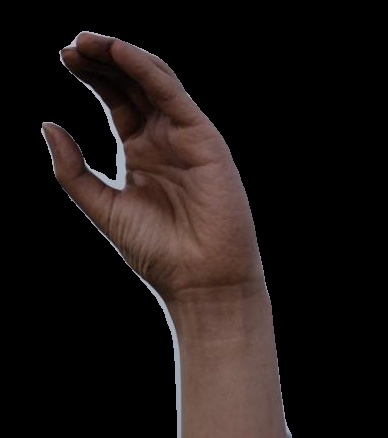

C
1/1 [==============================] - 0s 369ms/step


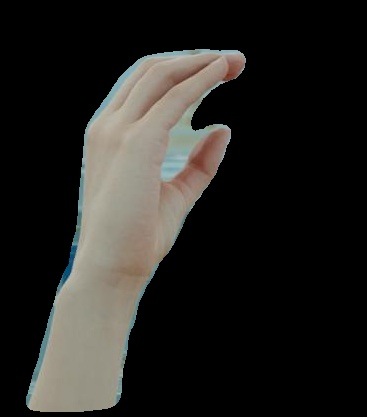

C
1/1 [==============================] - 1s 577ms/step


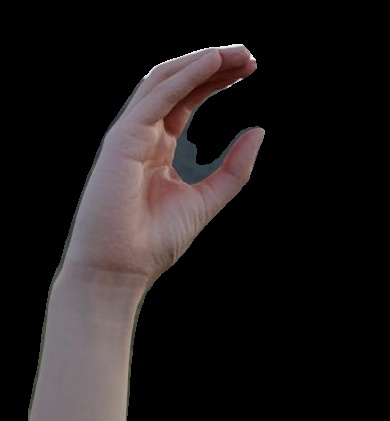

C
1/1 [==============================] - 1s 617ms/step


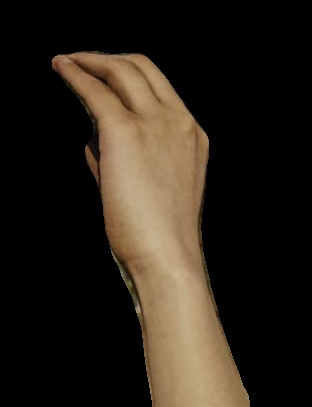

C
1/1 [==============================] - 1s 583ms/step


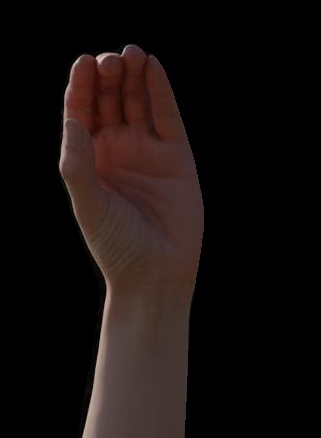

C
1/1 [==============================] - 1s 548ms/step


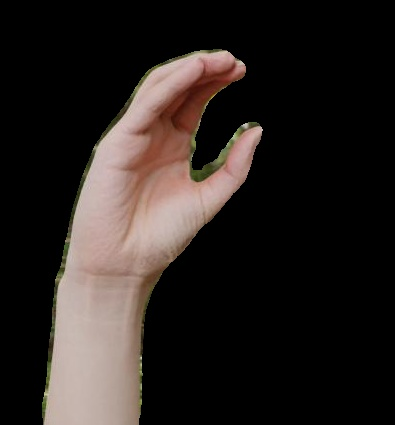

C
1/1 [==============================] - 0s 435ms/step


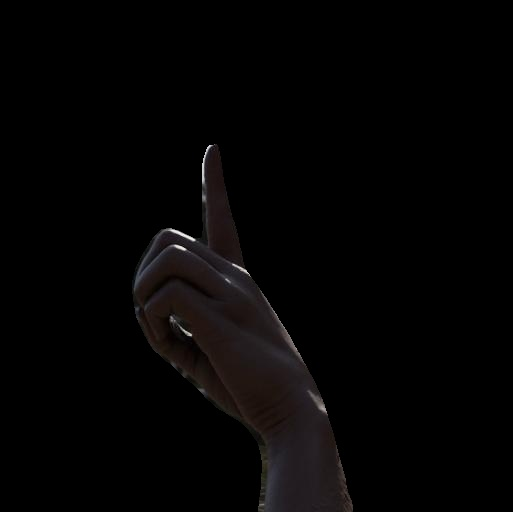

D
1/1 [==============================] - 0s 370ms/step


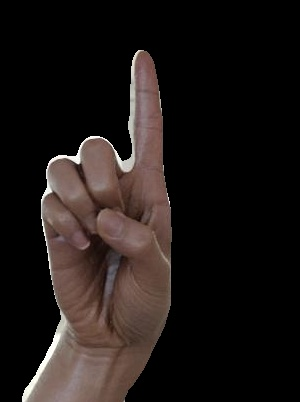

D
1/1 [==============================] - 0s 367ms/step


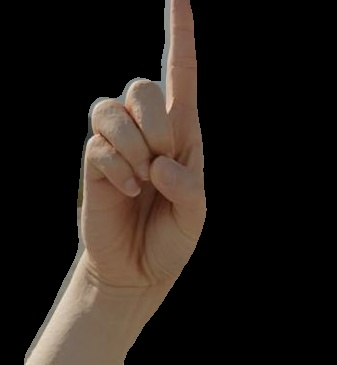

D
1/1 [==============================] - 0s 352ms/step


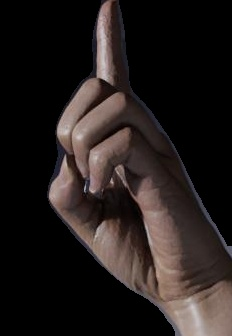

D
1/1 [==============================] - 0s 380ms/step


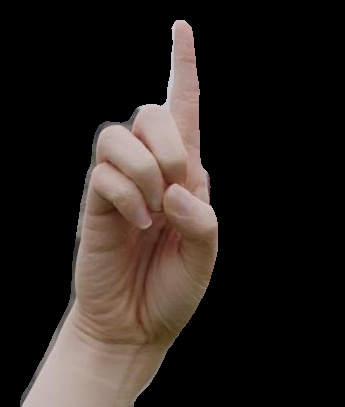

D
1/1 [==============================] - 0s 362ms/step


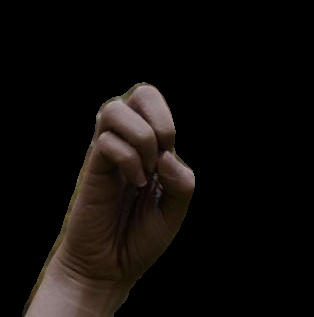

D
1/1 [==============================] - 0s 369ms/step


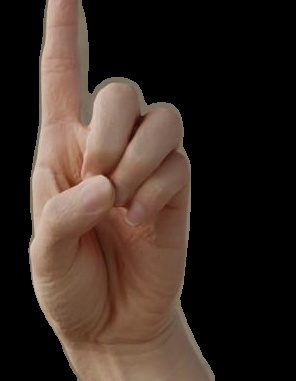

D
1/1 [==============================] - 0s 348ms/step


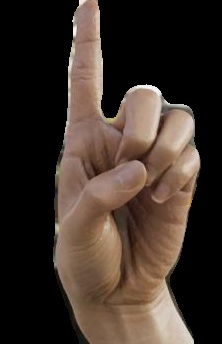

D
1/1 [==============================] - 0s 378ms/step


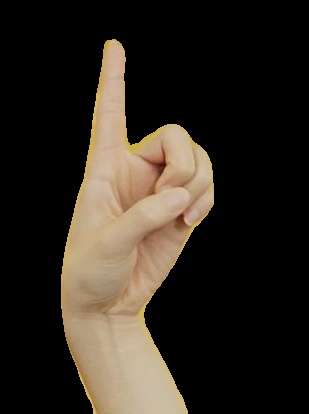

D
1/1 [==============================] - 0s 348ms/step


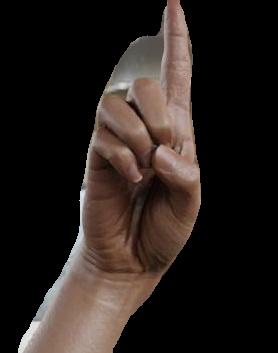

D
1/1 [==============================] - 0s 360ms/step


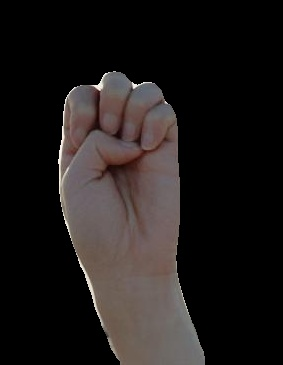

E
1/1 [==============================] - 0s 361ms/step


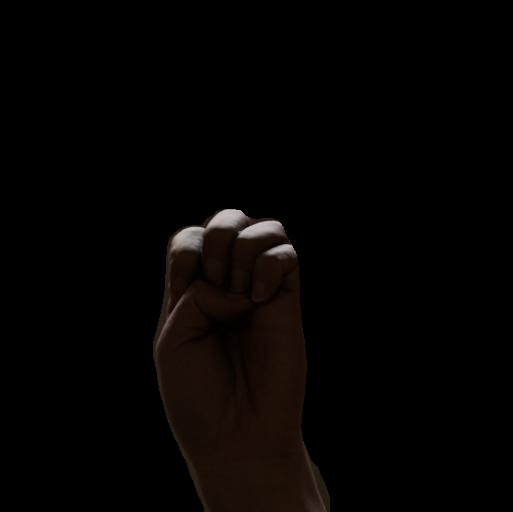

E
1/1 [==============================] - 0s 348ms/step


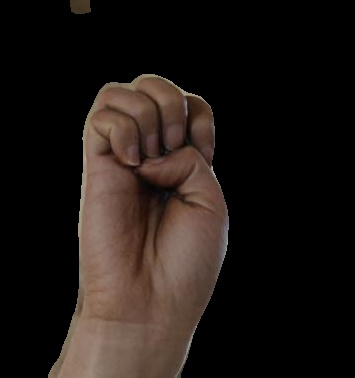

E
1/1 [==============================] - 0s 374ms/step


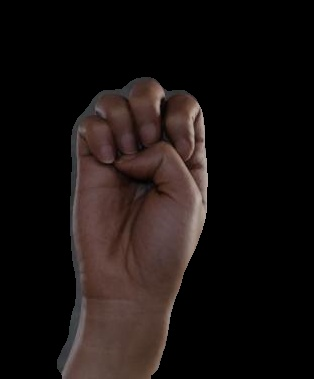

E
1/1 [==============================] - 0s 373ms/step


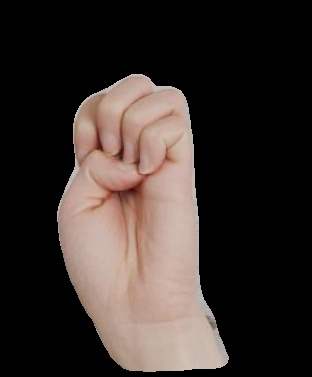

E
1/1 [==============================] - 0s 372ms/step


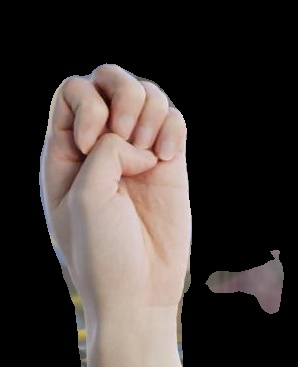

E
1/1 [==============================] - 0s 389ms/step


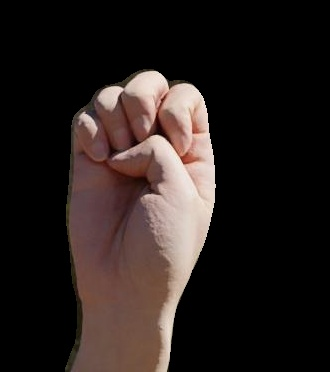

E
1/1 [==============================] - 0s 360ms/step


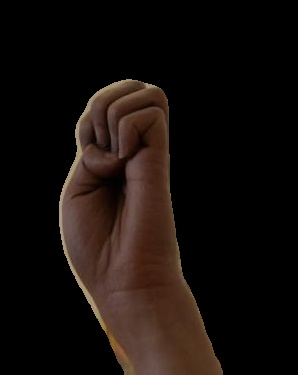

E
1/1 [==============================] - 1s 592ms/step


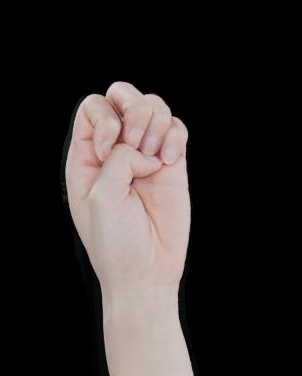

E
1/1 [==============================] - 1s 568ms/step


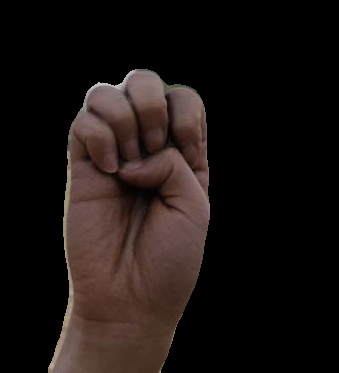

E
1/1 [==============================] - 1s 559ms/step


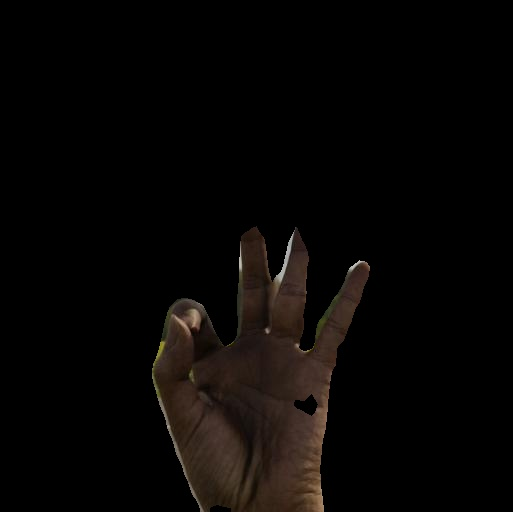

F
1/1 [==============================] - 1s 573ms/step


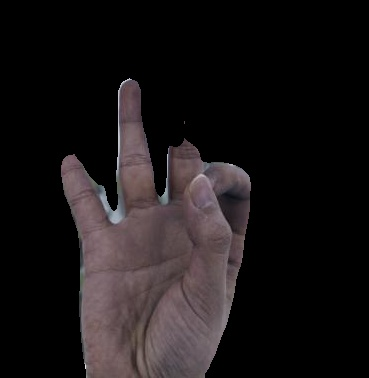

F
1/1 [==============================] - 0s 417ms/step


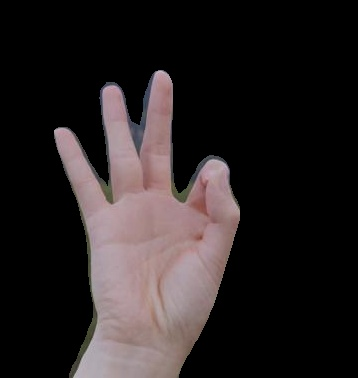

F
1/1 [==============================] - 0s 376ms/step


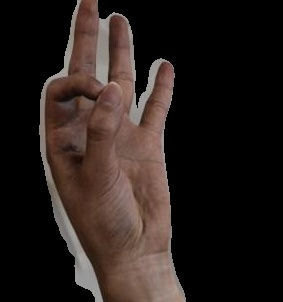

F
1/1 [==============================] - 0s 363ms/step


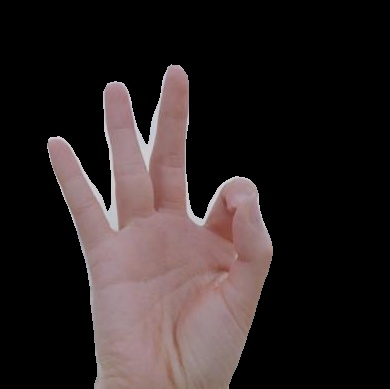

F
1/1 [==============================] - 0s 398ms/step


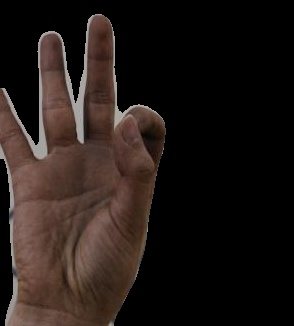

F
1/1 [==============================] - 0s 369ms/step


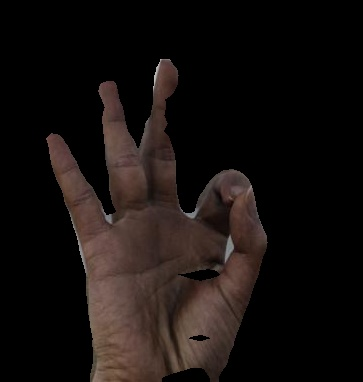

F
1/1 [==============================] - 0s 364ms/step


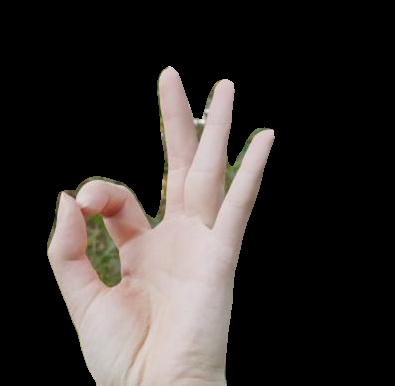

F
1/1 [==============================] - 0s 375ms/step


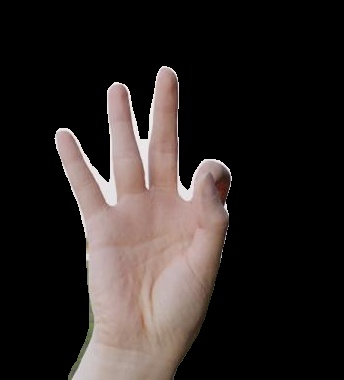

F
1/1 [==============================] - 0s 408ms/step


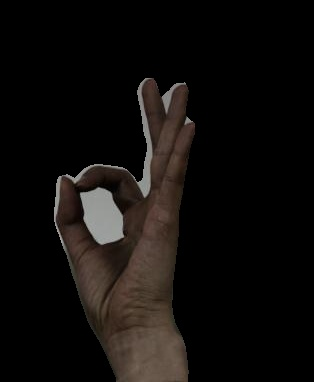

F
1/1 [==============================] - 0s 414ms/step


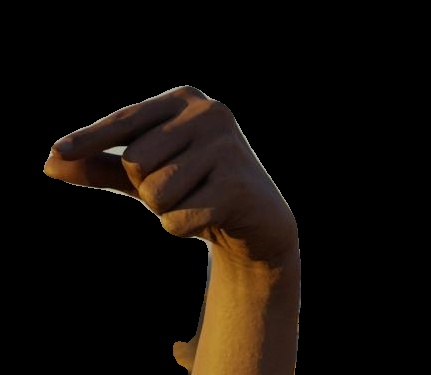

G
1/1 [==============================] - 0s 358ms/step


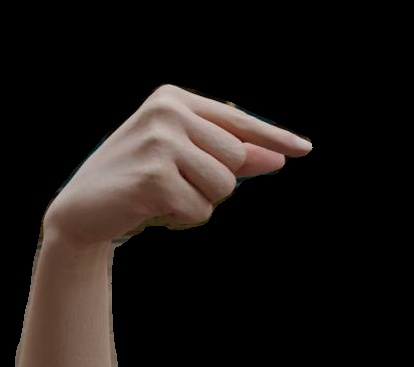

G
1/1 [==============================] - 0s 368ms/step


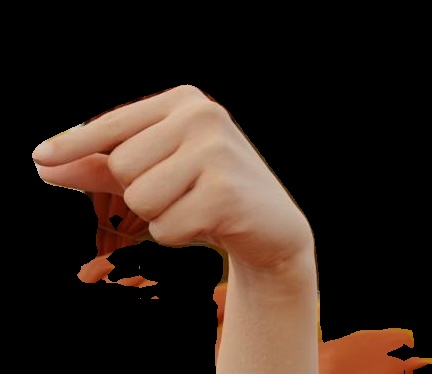

G
1/1 [==============================] - 0s 417ms/step


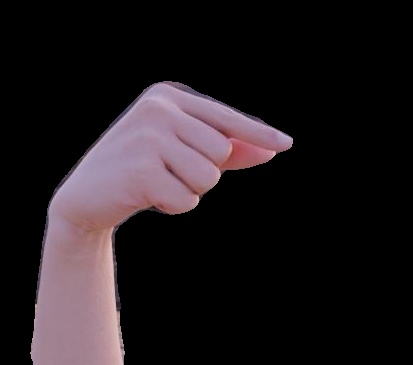

G
1/1 [==============================] - 0s 414ms/step


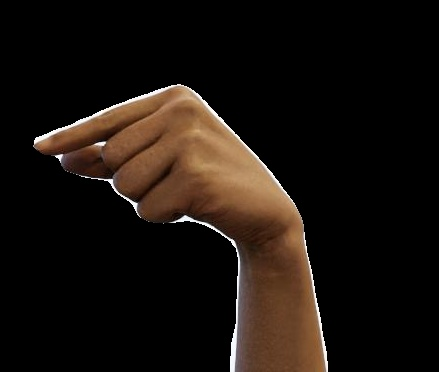

G
1/1 [==============================] - 0s 379ms/step


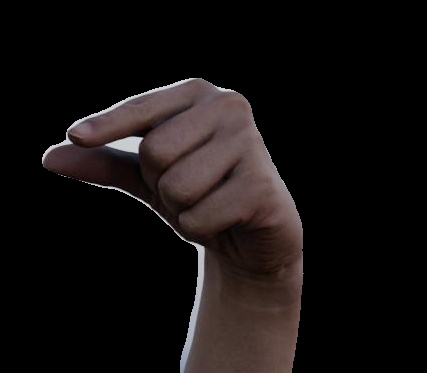

G
1/1 [==============================] - 0s 424ms/step


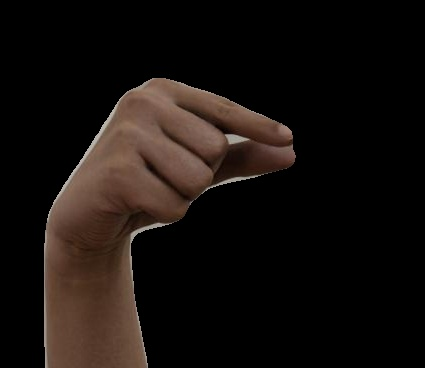

G
1/1 [==============================] - 0s 431ms/step


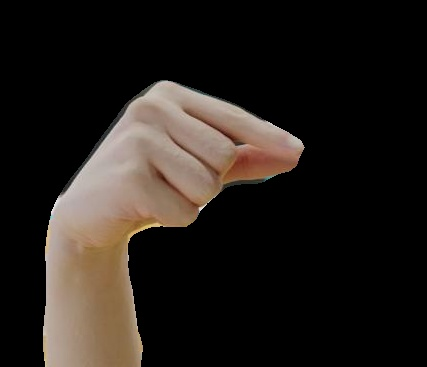

G
1/1 [==============================] - 1s 609ms/step


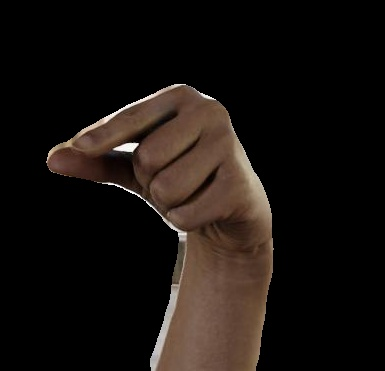

G
1/1 [==============================] - 1s 570ms/step


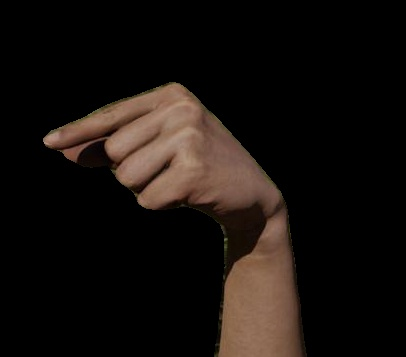

G
1/1 [==============================] - 1s 647ms/step


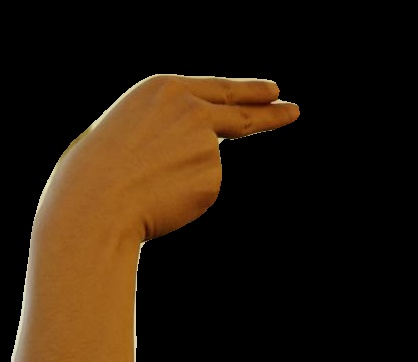

H
1/1 [==============================] - 1s 659ms/step


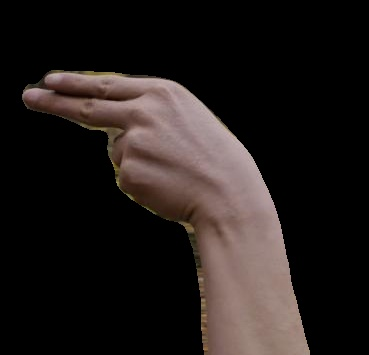

H
1/1 [==============================] - 0s 380ms/step


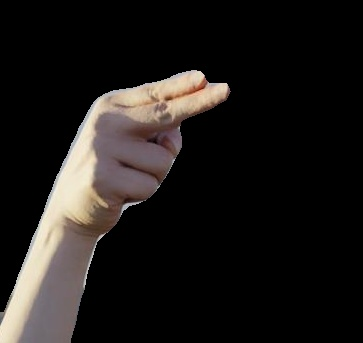

D
1/1 [==============================] - 0s 456ms/step


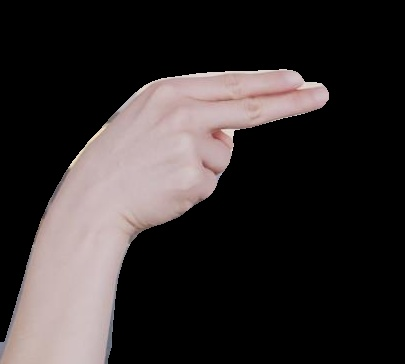

H
1/1 [==============================] - 0s 378ms/step


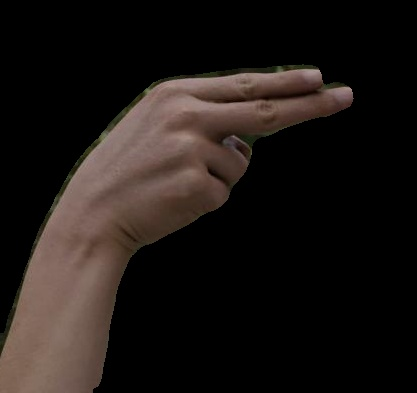

H
1/1 [==============================] - 0s 418ms/step


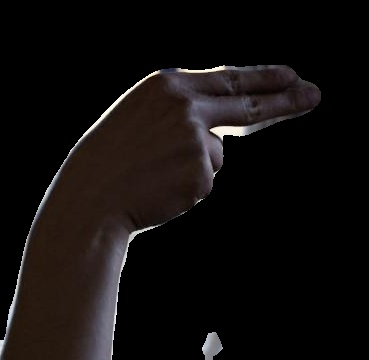

H
1/1 [==============================] - 0s 423ms/step


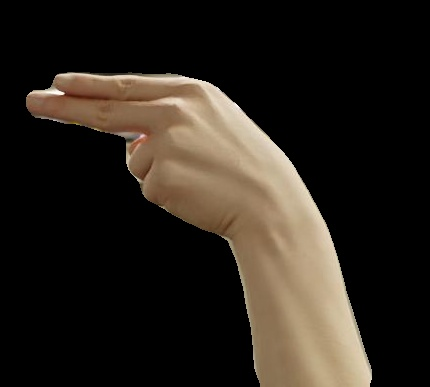

H
1/1 [==============================] - 0s 416ms/step


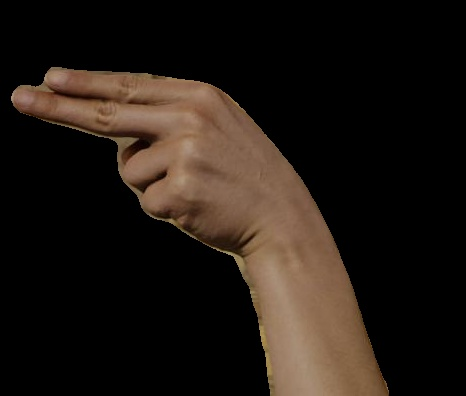

H
1/1 [==============================] - 0s 395ms/step


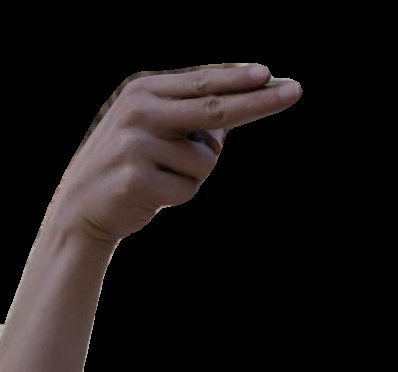

H
1/1 [==============================] - 0s 402ms/step


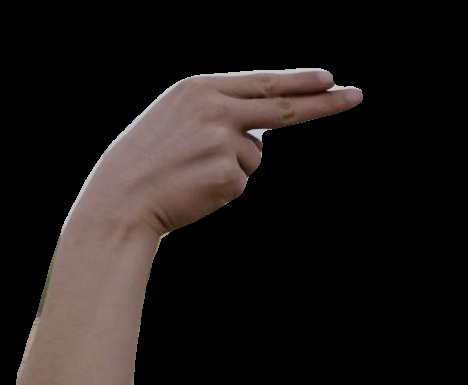

H
1/1 [==============================] - 0s 435ms/step


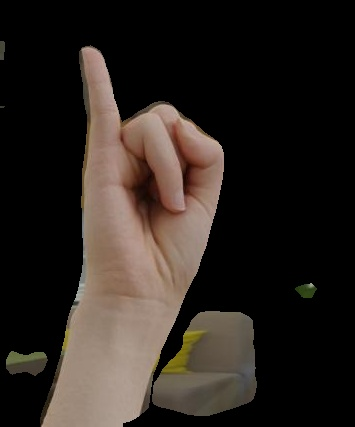

I
1/1 [==============================] - 0s 452ms/step


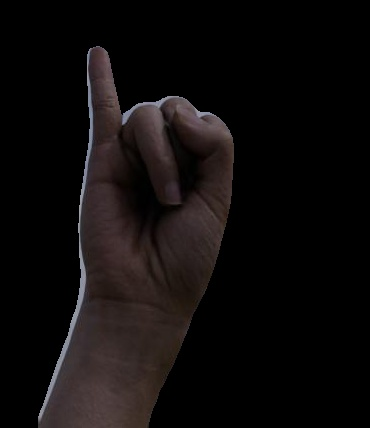

I
1/1 [==============================] - 0s 395ms/step


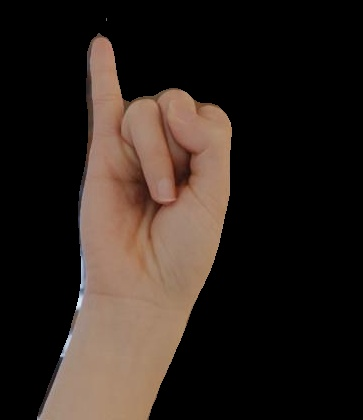

I
1/1 [==============================] - 0s 447ms/step


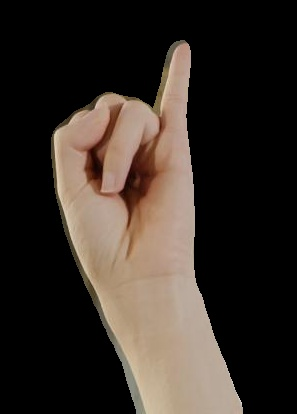

I
1/1 [==============================] - 0s 403ms/step


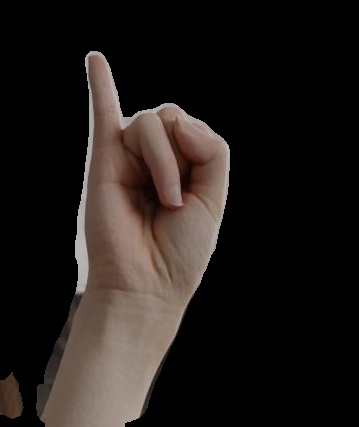

I
1/1 [==============================] - 0s 454ms/step


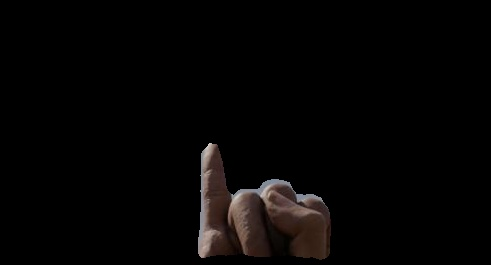

V
1/1 [==============================] - 0s 461ms/step


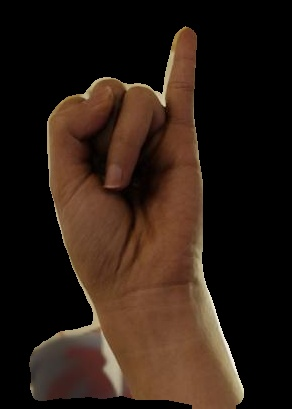

I
1/1 [==============================] - 1s 574ms/step


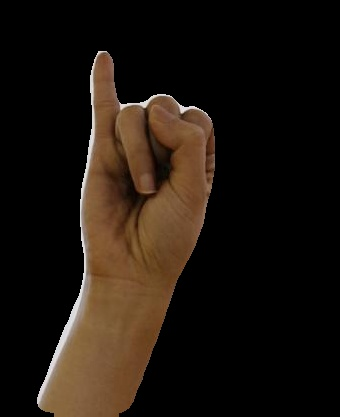

I
1/1 [==============================] - 1s 658ms/step


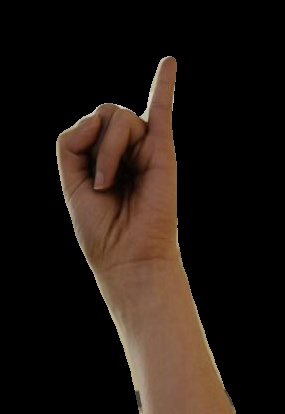

I
1/1 [==============================] - 1s 642ms/step


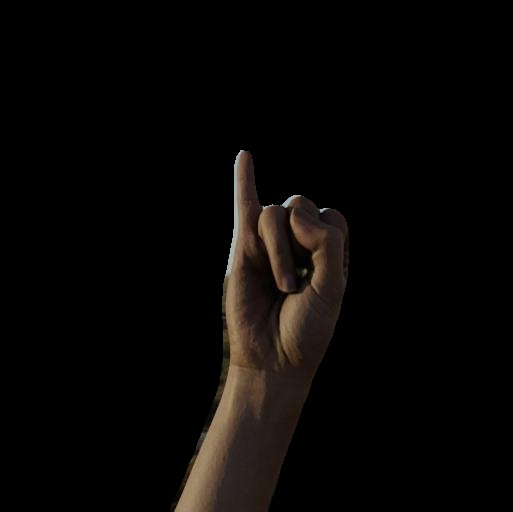

U
1/1 [==============================] - 1s 661ms/step


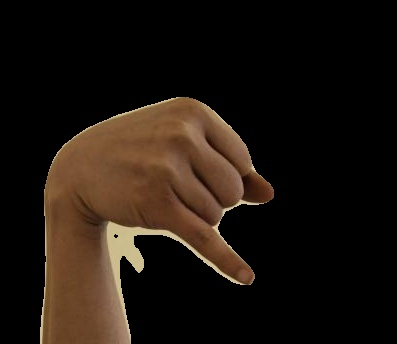

J
1/1 [==============================] - 1s 503ms/step


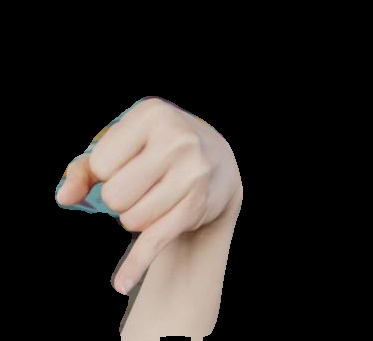

J
1/1 [==============================] - 0s 478ms/step


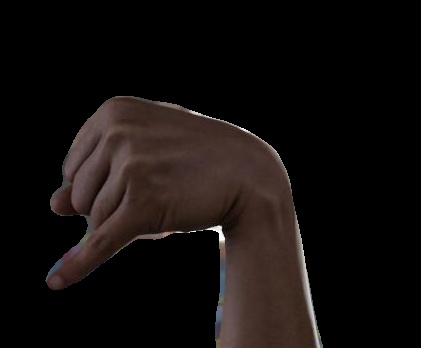

J
1/1 [==============================] - 0s 463ms/step


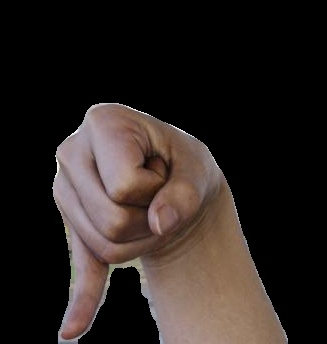

J
1/1 [==============================] - 0s 402ms/step


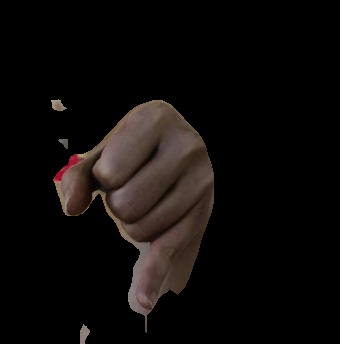

J
1/1 [==============================] - 0s 394ms/step


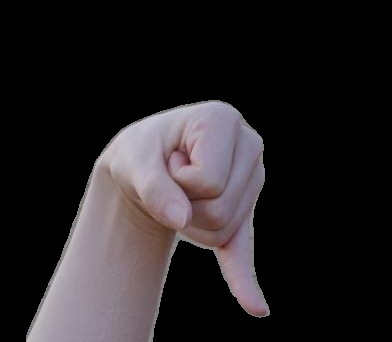

J
1/1 [==============================] - 0s 487ms/step


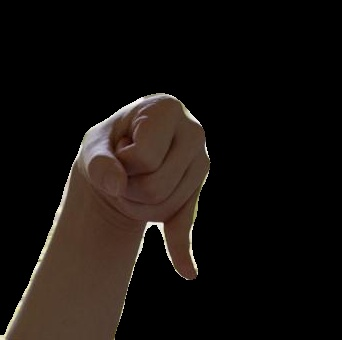

J
1/1 [==============================] - 0s 484ms/step


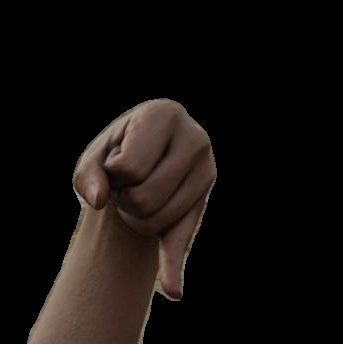

J
1/1 [==============================] - 0s 392ms/step


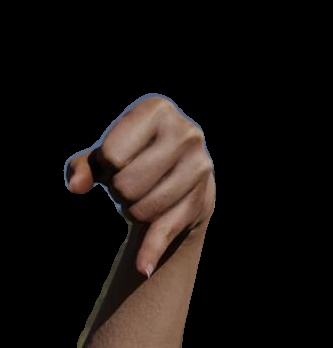

J
1/1 [==============================] - 0s 409ms/step


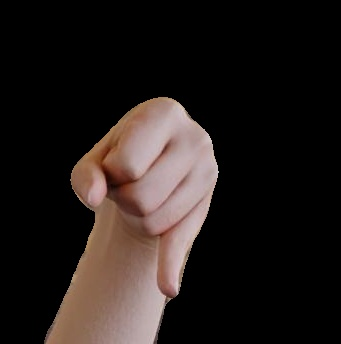

J
1/1 [==============================] - 0s 487ms/step


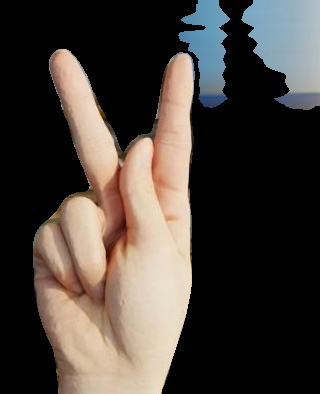

V
1/1 [==============================] - 0s 402ms/step


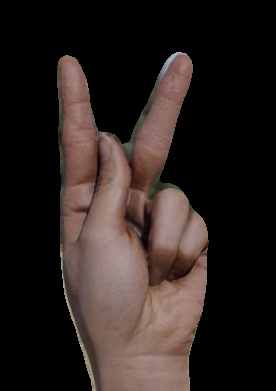

K
1/1 [==============================] - 0s 402ms/step


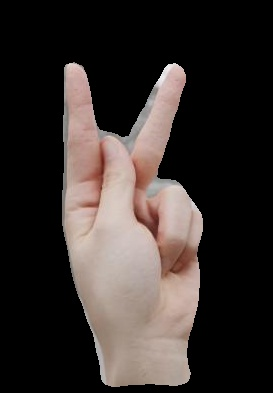

K
1/1 [==============================] - 1s 510ms/step


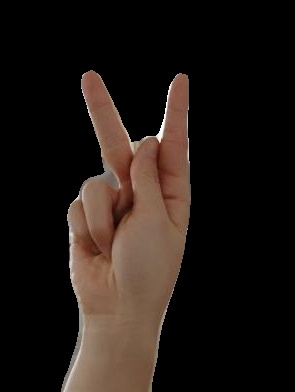

K
1/1 [==============================] - 0s 492ms/step


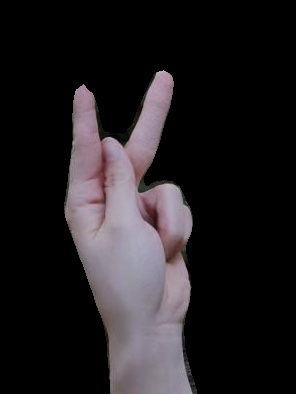

K
1/1 [==============================] - 0s 412ms/step


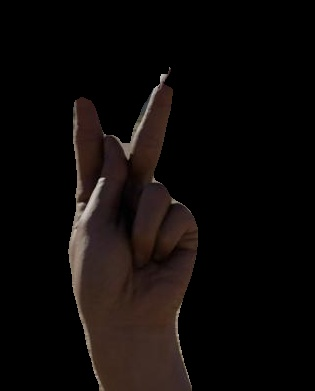

K
1/1 [==============================] - 1s 505ms/step


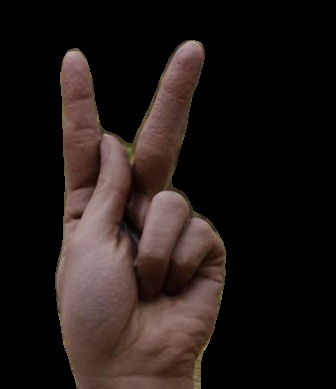

K
1/1 [==============================] - 0s 356ms/step


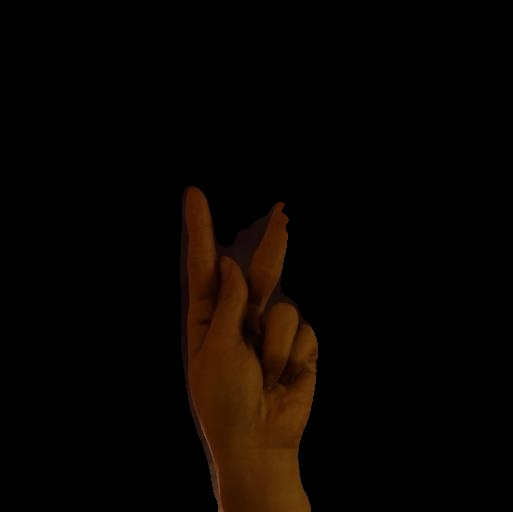

W
1/1 [==============================] - 0s 434ms/step


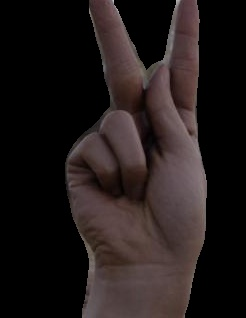

K
1/1 [==============================] - 0s 495ms/step


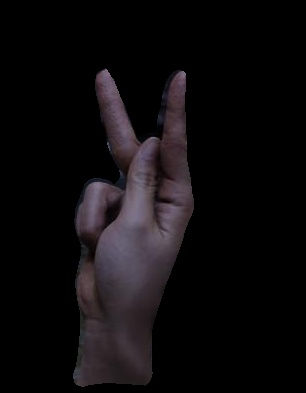

K
1/1 [==============================] - 0s 402ms/step


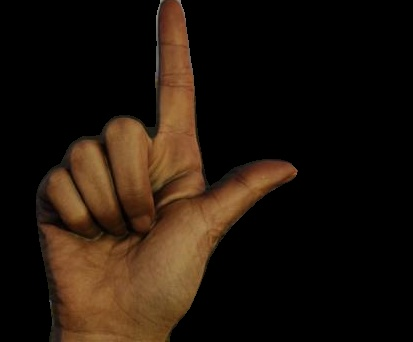

L
1/1 [==============================] - 0s 418ms/step


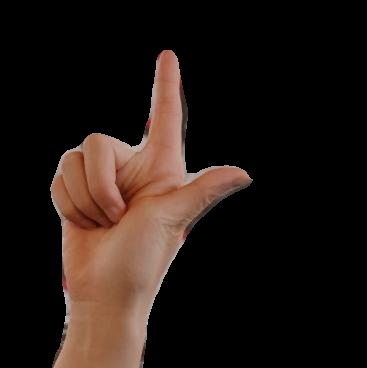

L
1/1 [==============================] - 0s 413ms/step


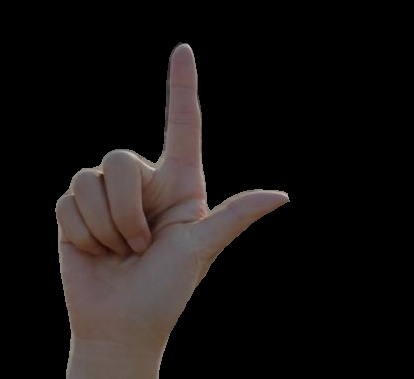

L
1/1 [==============================] - 0s 421ms/step


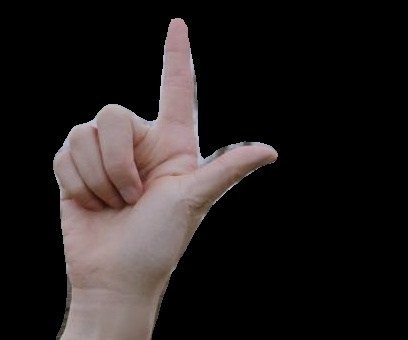

L
1/1 [==============================] - 1s 520ms/step


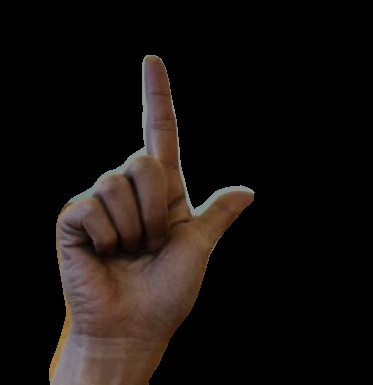

L
1/1 [==============================] - 0s 414ms/step


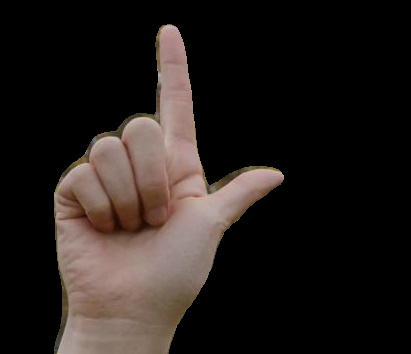

L
1/1 [==============================] - 1s 501ms/step


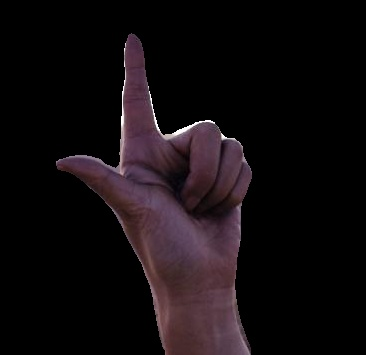

L
1/1 [==============================] - 1s 524ms/step


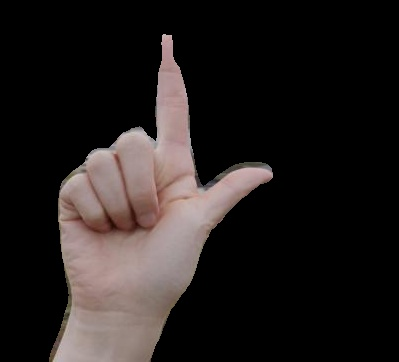

L
1/1 [==============================] - 1s 539ms/step


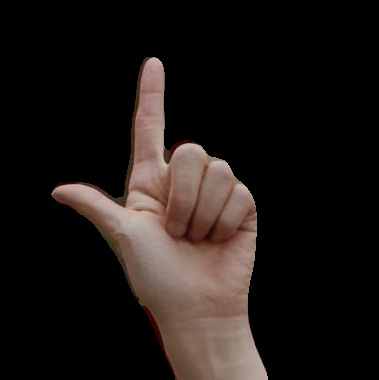

L
1/1 [==============================] - 1s 571ms/step


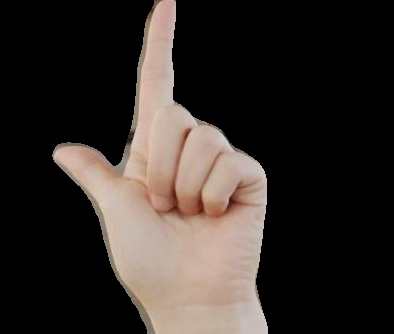

L
1/1 [==============================] - 1s 668ms/step


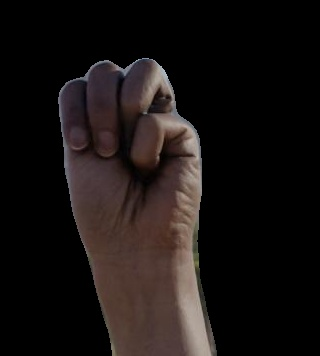

N
1/1 [==============================] - 1s 578ms/step


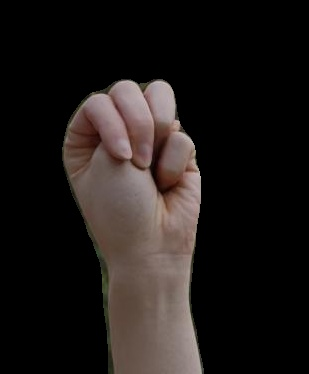

M
1/1 [==============================] - 1s 672ms/step


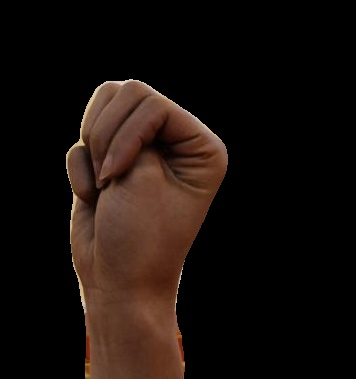

M
1/1 [==============================] - 1s 604ms/step


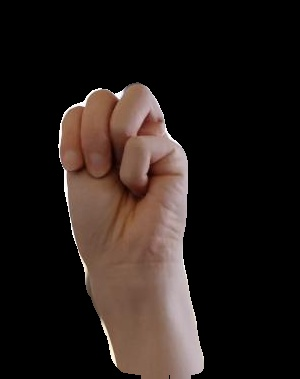

M
1/1 [==============================] - 1s 640ms/step


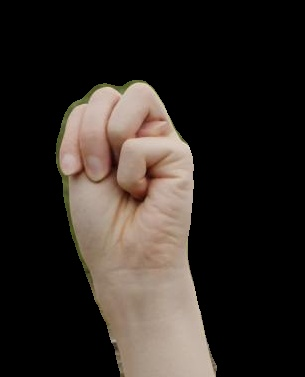

M
1/1 [==============================] - 1s 623ms/step


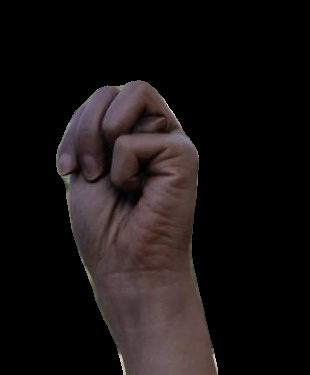

M
1/1 [==============================] - 1s 617ms/step


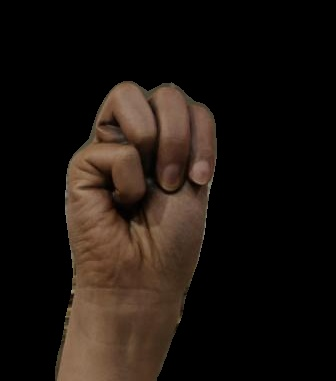

M
1/1 [==============================] - 1s 573ms/step


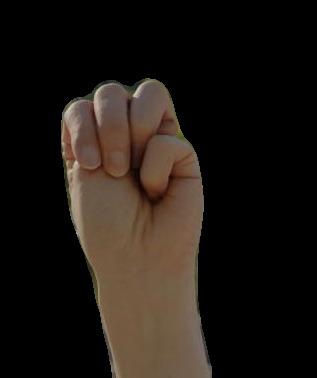

M
1/1 [==============================] - 1s 564ms/step


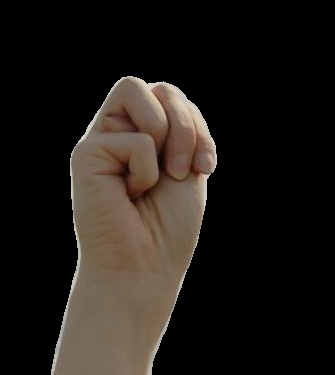

M
1/1 [==============================] - 1s 574ms/step


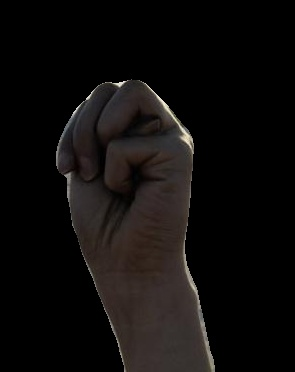

M
1/1 [==============================] - 1s 585ms/step


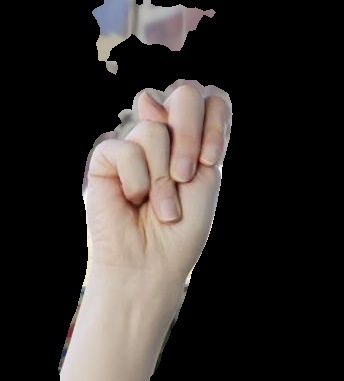

N
1/1 [==============================] - 1s 588ms/step


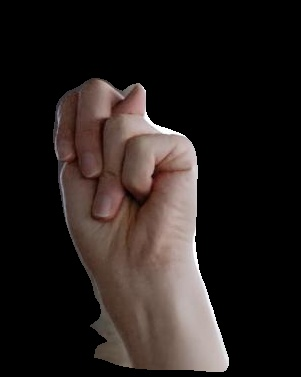

N
1/1 [==============================] - 1s 559ms/step


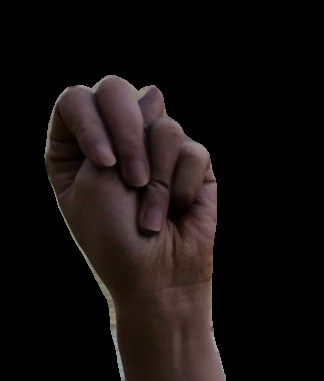

N
1/1 [==============================] - 1s 531ms/step


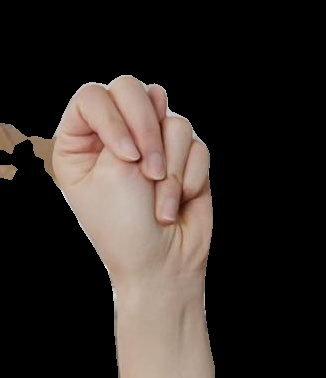

N
1/1 [==============================] - 0s 494ms/step


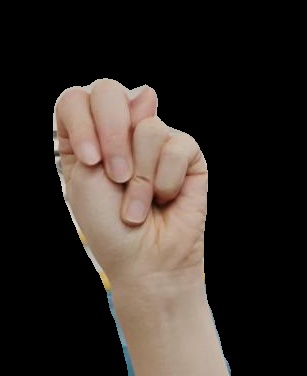

N
1/1 [==============================] - 1s 597ms/step


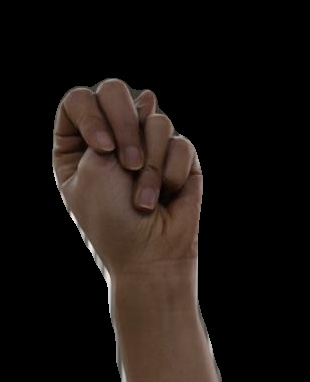

N
1/1 [==============================] - 1s 522ms/step


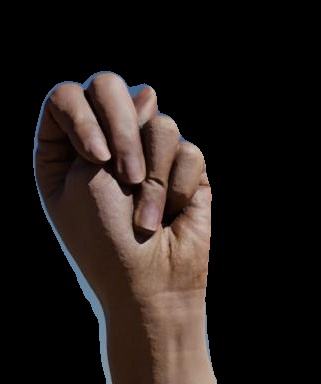

N
1/1 [==============================] - 1s 554ms/step


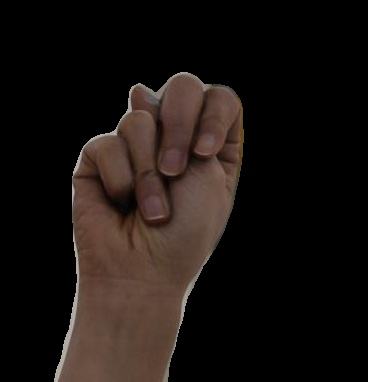

N
1/1 [==============================] - 0s 482ms/step


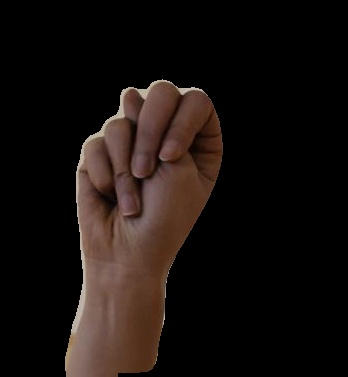

N
1/1 [==============================] - 0s 467ms/step


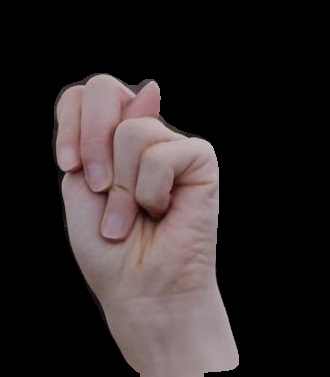

N
1/1 [==============================] - 1s 671ms/step


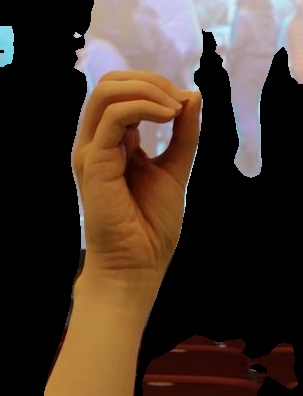

O
1/1 [==============================] - 1s 666ms/step


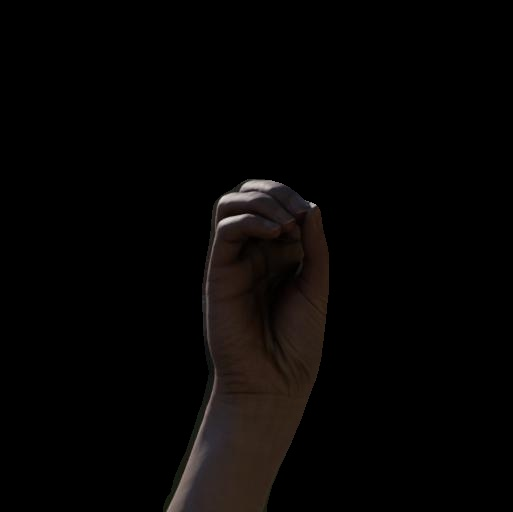

X
1/1 [==============================] - 1s 709ms/step


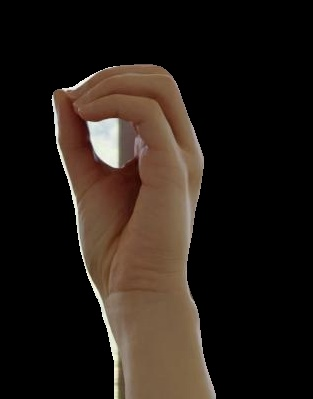

O
1/1 [==============================] - 1s 654ms/step


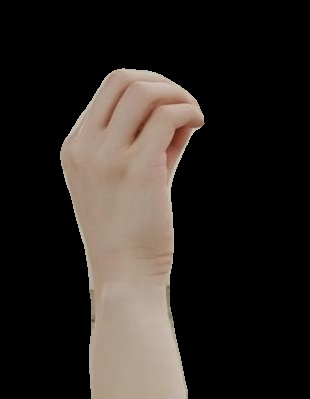

O
1/1 [==============================] - 1s 583ms/step


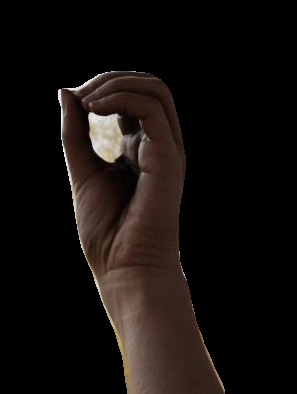

O
1/1 [==============================] - 1s 580ms/step


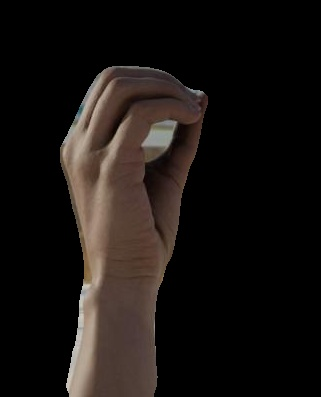

O
1/1 [==============================] - 1s 566ms/step


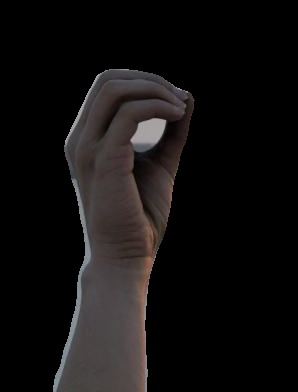

O
1/1 [==============================] - 1s 540ms/step


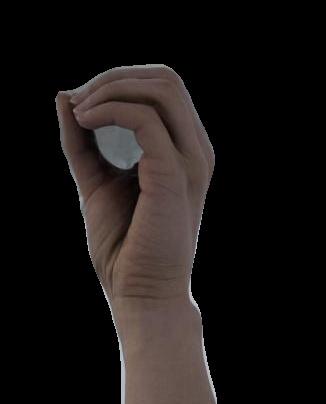

O
1/1 [==============================] - 0s 485ms/step


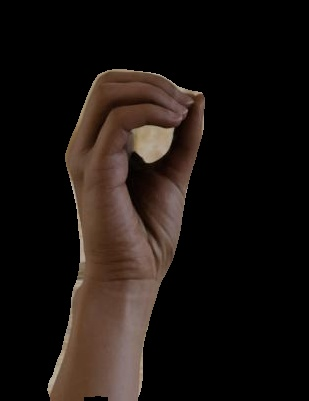

O
1/1 [==============================] - 1s 583ms/step


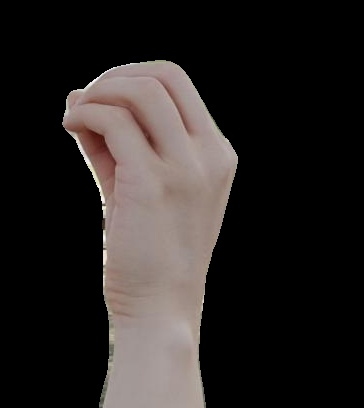

O
1/1 [==============================] - 1s 585ms/step


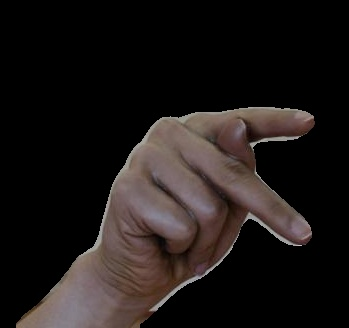

P
1/1 [==============================] - 1s 550ms/step


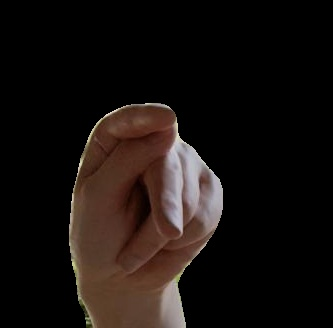

P
1/1 [==============================] - 1s 535ms/step


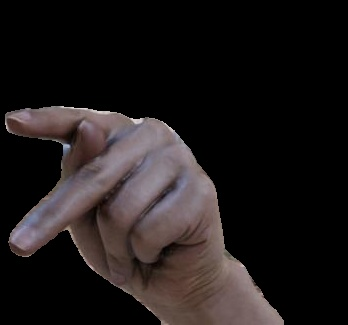

P
1/1 [==============================] - 1s 565ms/step


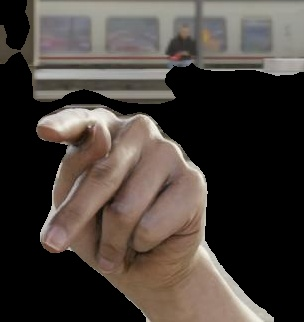

P
1/1 [==============================] - 1s 578ms/step


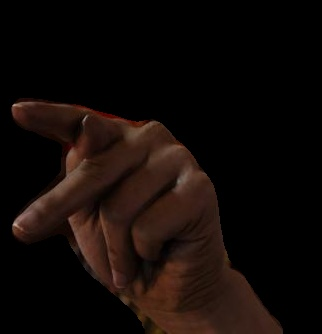

P
1/1 [==============================] - 1s 522ms/step


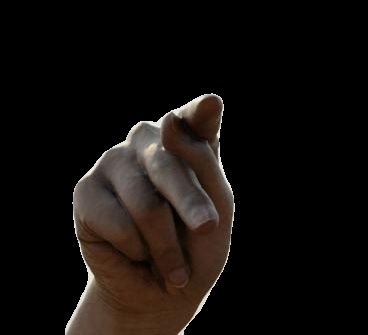

P
1/1 [==============================] - 0s 481ms/step


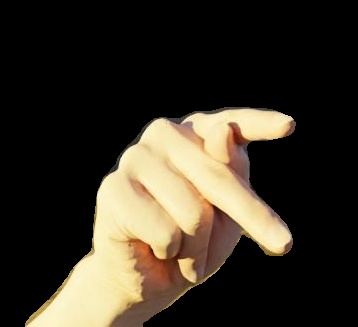

P
1/1 [==============================] - 1s 563ms/step


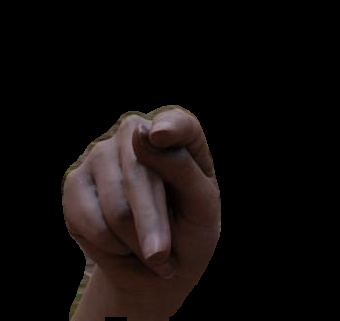

P
1/1 [==============================] - 1s 652ms/step


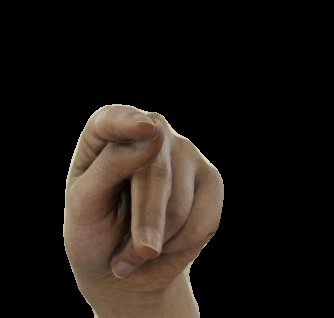

P
1/1 [==============================] - 1s 597ms/step


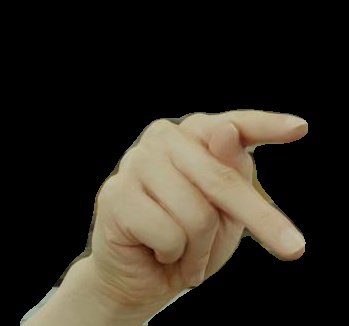

P
1/1 [==============================] - 1s 659ms/step


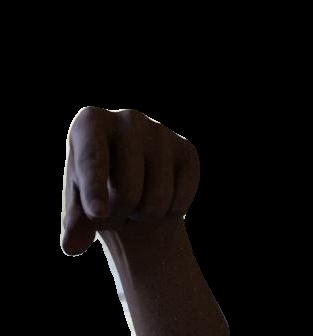

Q
1/1 [==============================] - 1s 660ms/step


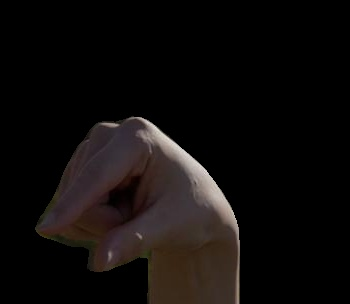

Q
1/1 [==============================] - 1s 665ms/step


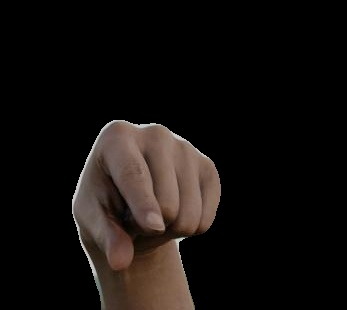

Q
1/1 [==============================] - 1s 610ms/step


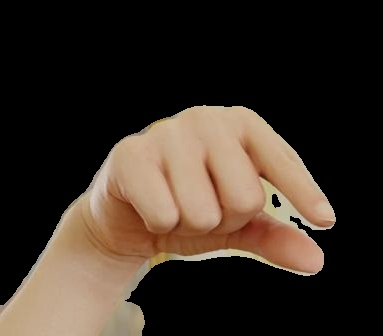

Q
1/1 [==============================] - 1s 568ms/step


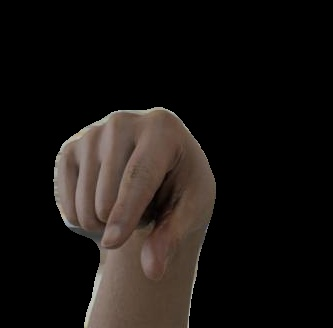

Q
1/1 [==============================] - 1s 546ms/step


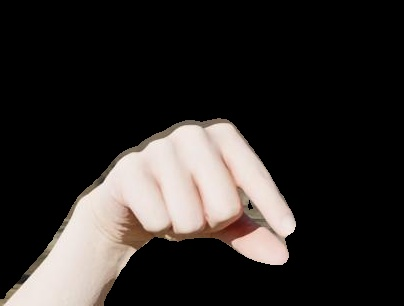

Q
1/1 [==============================] - 1s 570ms/step


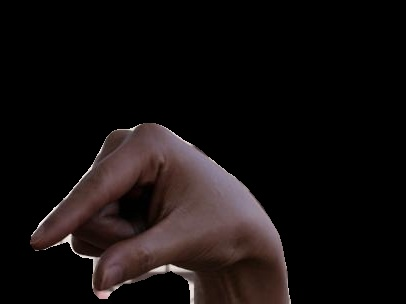

Q
1/1 [==============================] - 1s 557ms/step


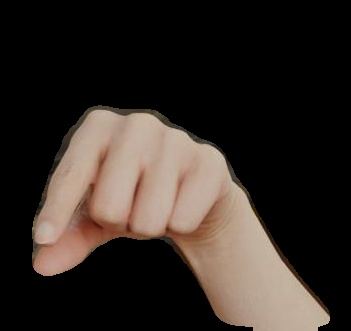

Q
1/1 [==============================] - 1s 552ms/step


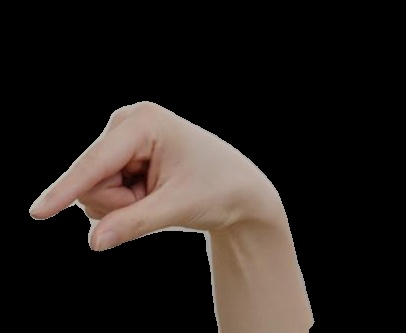

Q
1/1 [==============================] - 1s 585ms/step


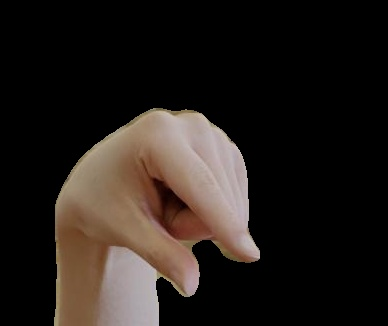

Q
1/1 [==============================] - 1s 584ms/step


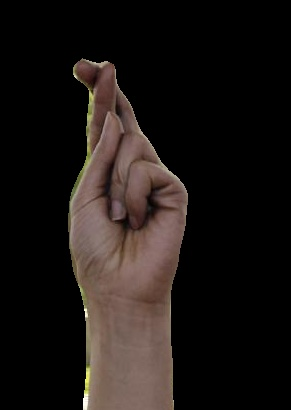

R
1/1 [==============================] - 1s 560ms/step


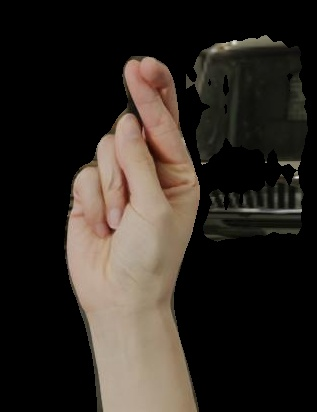

I
1/1 [==============================] - 1s 545ms/step


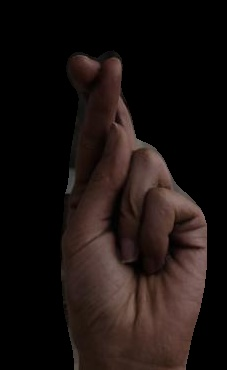

X
1/1 [==============================] - 1s 558ms/step


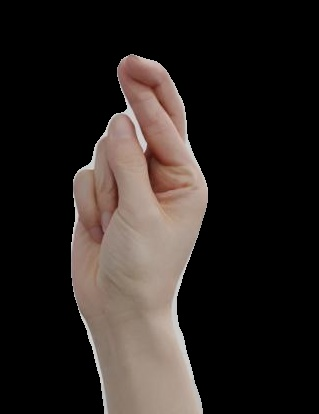

R
1/1 [==============================] - 1s 557ms/step


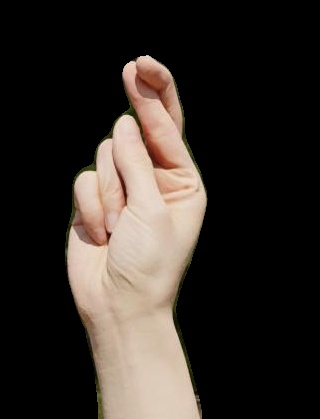

R
1/1 [==============================] - 1s 569ms/step


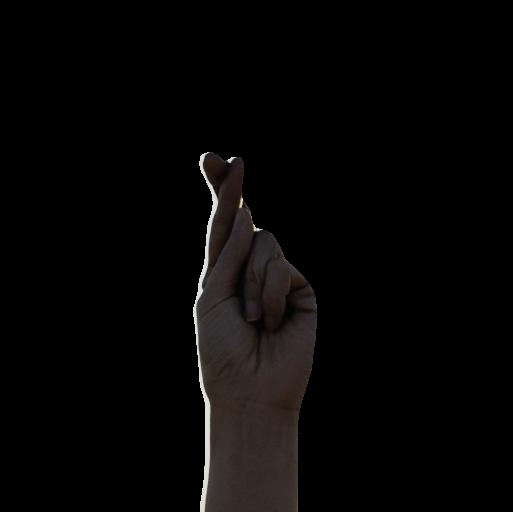

R
1/1 [==============================] - 1s 574ms/step


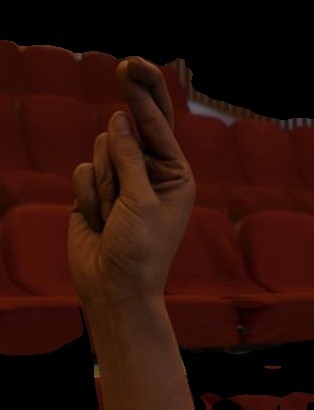

I
1/1 [==============================] - 1s 606ms/step


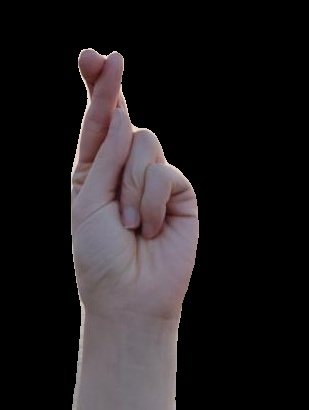

R
1/1 [==============================] - 1s 740ms/step


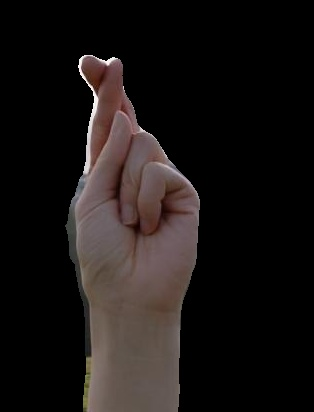

R
1/1 [==============================] - 1s 702ms/step


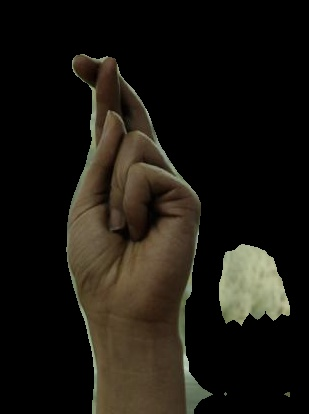

R
1/1 [==============================] - 1s 587ms/step


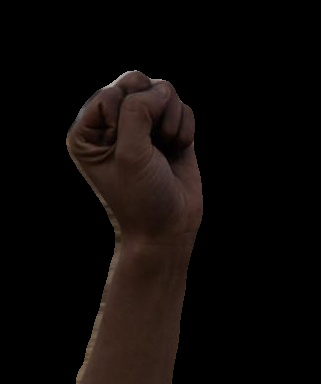

S
1/1 [==============================] - 1s 682ms/step


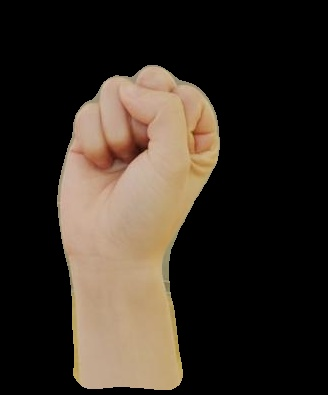

S
1/1 [==============================] - 1s 619ms/step


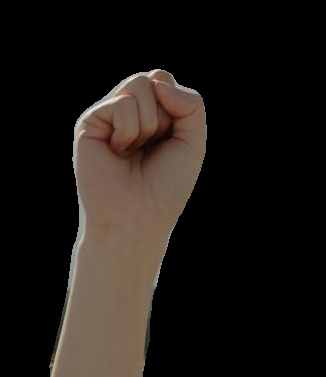

S
1/1 [==============================] - 1s 560ms/step


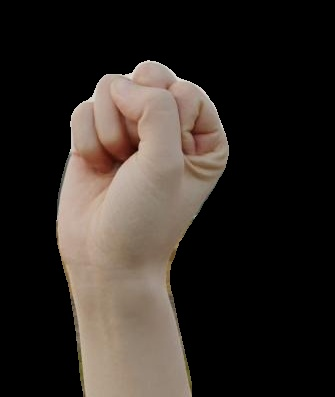

S
1/1 [==============================] - 1s 566ms/step


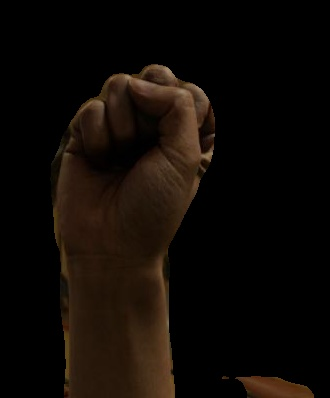

S
1/1 [==============================] - 1s 544ms/step


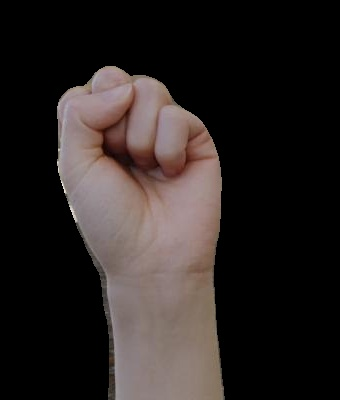

S
1/1 [==============================] - 1s 546ms/step


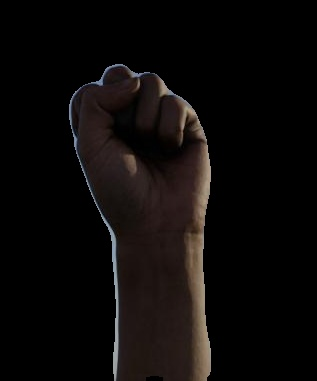

S
1/1 [==============================] - 1s 570ms/step


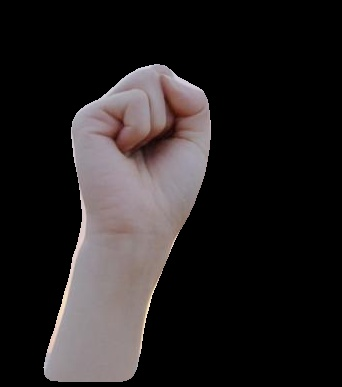

S
1/1 [==============================] - 1s 577ms/step


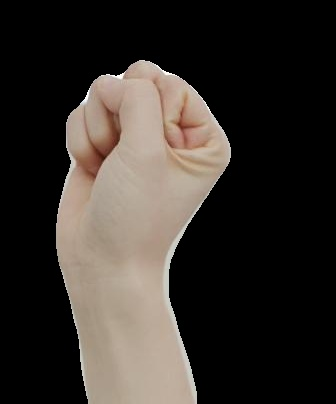

S
1/1 [==============================] - 1s 568ms/step


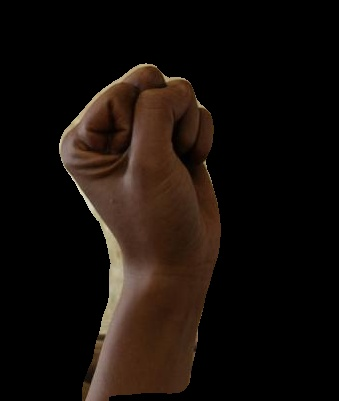

S
1/1 [==============================] - 1s 546ms/step


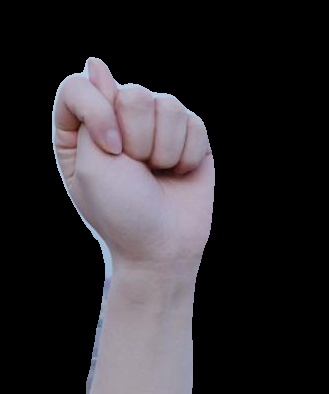

T
1/1 [==============================] - 1s 585ms/step


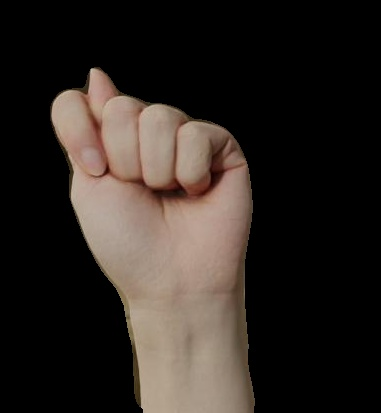

T
1/1 [==============================] - 1s 561ms/step


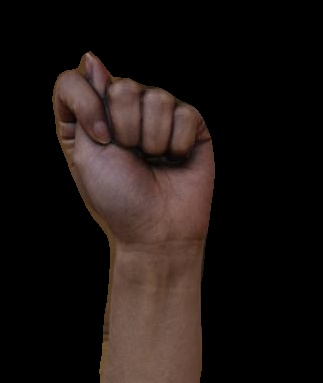

T
1/1 [==============================] - 1s 558ms/step


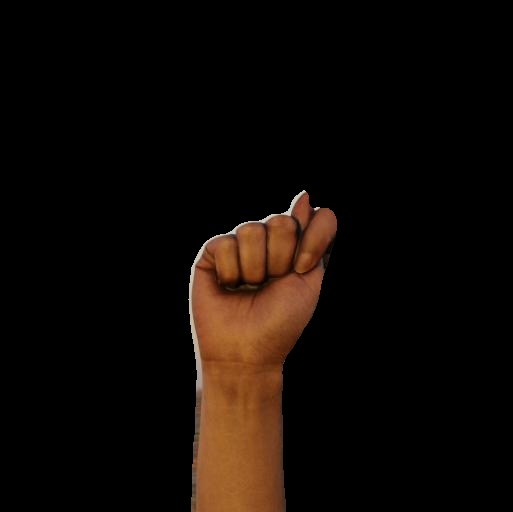

T
1/1 [==============================] - 1s 553ms/step


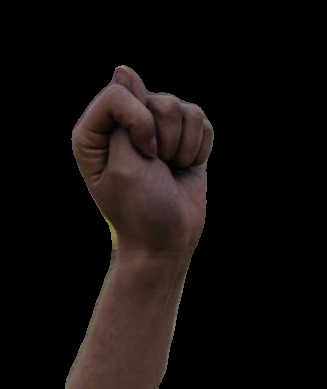

T
1/1 [==============================] - 1s 552ms/step


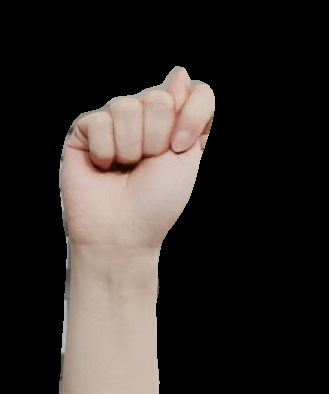

T
1/1 [==============================] - 1s 614ms/step


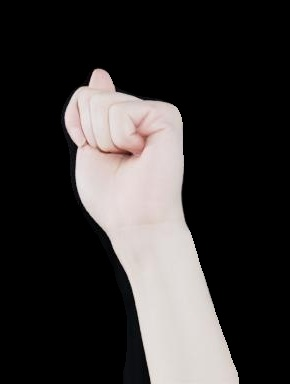

T
1/1 [==============================] - 1s 615ms/step


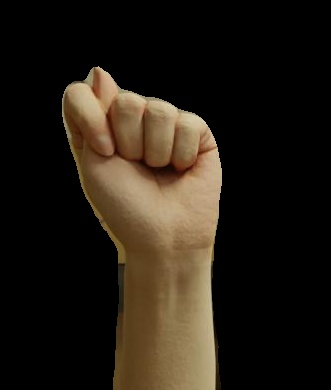

T
1/1 [==============================] - 1s 598ms/step


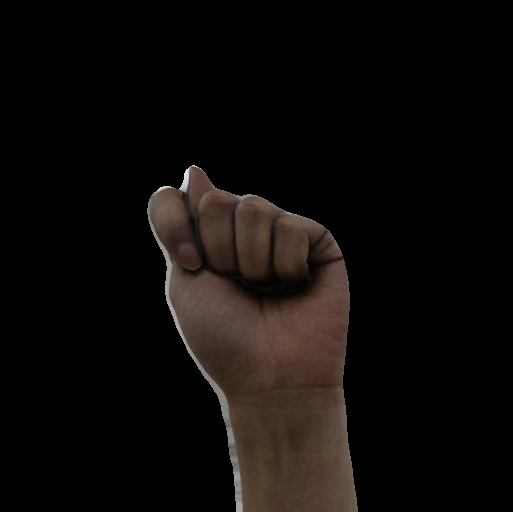

T
1/1 [==============================] - 1s 678ms/step


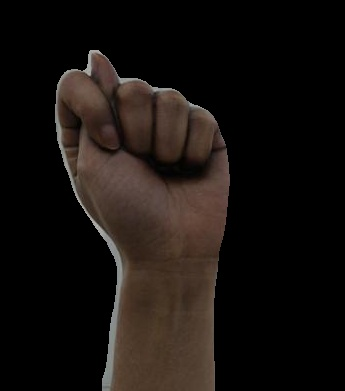

T
1/1 [==============================] - 1s 625ms/step


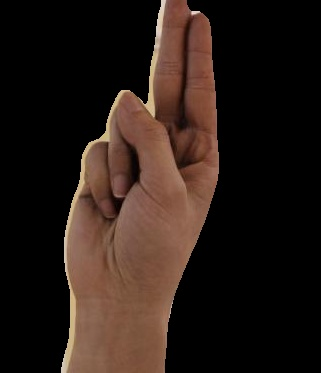

U
1/1 [==============================] - 1s 605ms/step


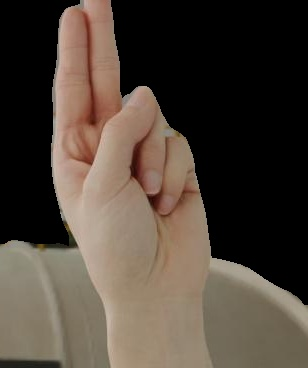

U
1/1 [==============================] - 1s 674ms/step


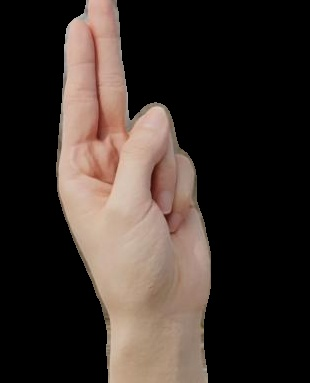

U
1/1 [==============================] - 1s 540ms/step


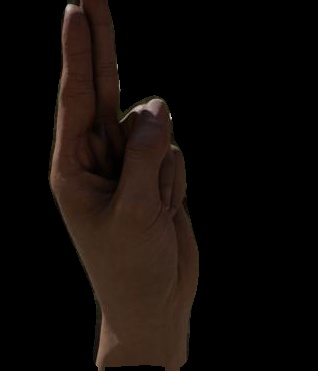

U
1/1 [==============================] - 1s 564ms/step


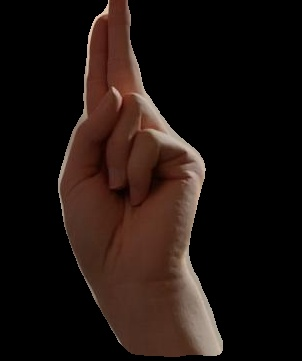

U
1/1 [==============================] - 1s 566ms/step


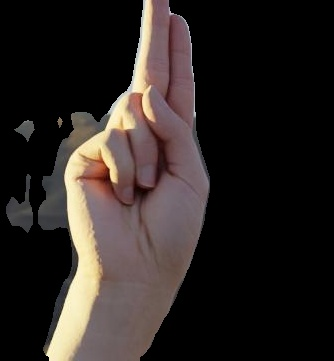

U
1/1 [==============================] - 1s 565ms/step


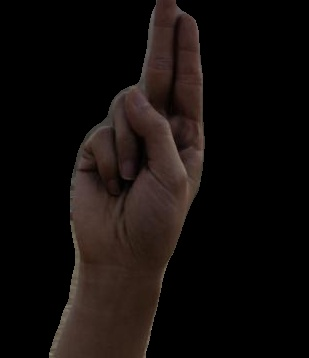

U
1/1 [==============================] - 1s 563ms/step


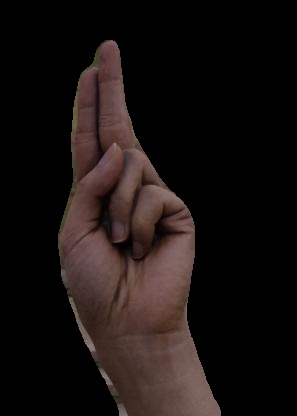

U
1/1 [==============================] - 1s 564ms/step


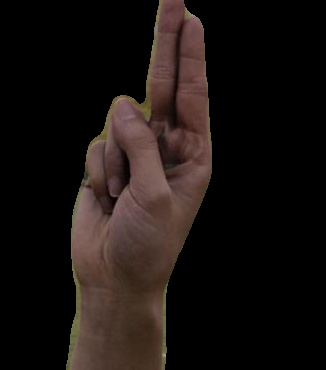

U
1/1 [==============================] - 1s 563ms/step


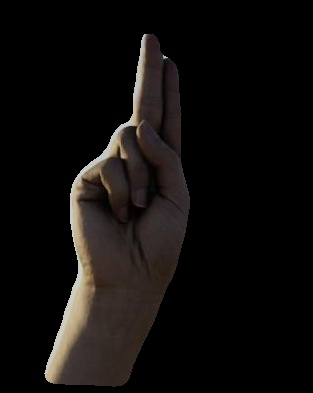

U
1/1 [==============================] - 1s 557ms/step


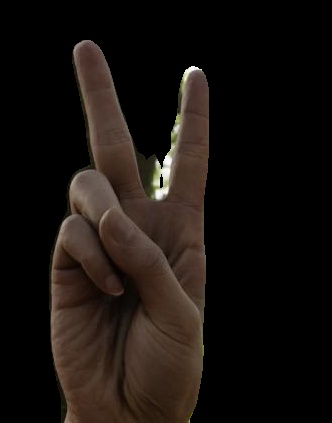

V
1/1 [==============================] - 1s 561ms/step


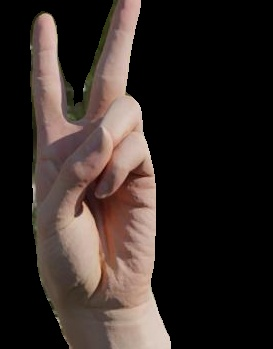

V
1/1 [==============================] - 1s 541ms/step


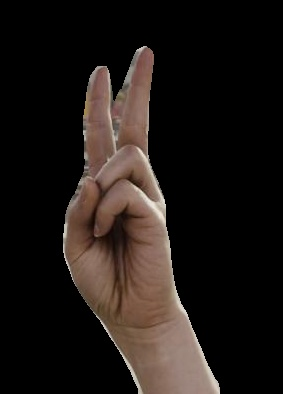

D
1/1 [==============================] - 1s 577ms/step


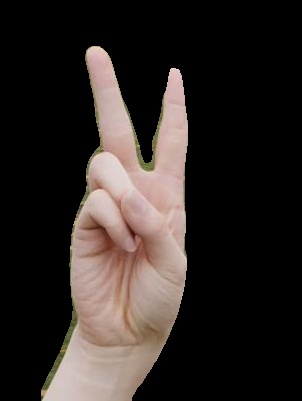

V
1/1 [==============================] - 1s 564ms/step


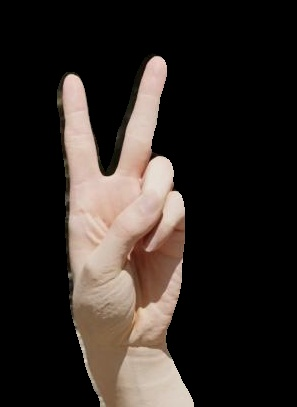

V
1/1 [==============================] - 1s 578ms/step


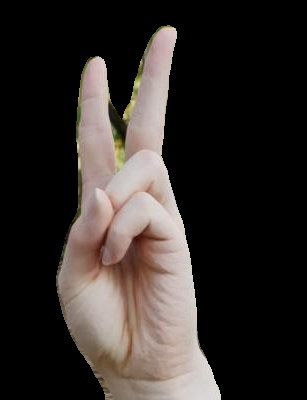

V
1/1 [==============================] - 1s 598ms/step


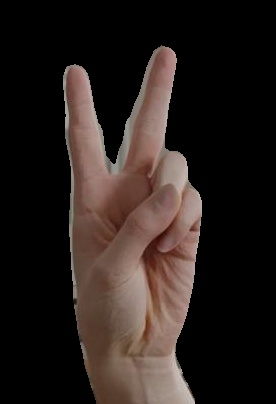

V
1/1 [==============================] - 1s 630ms/step


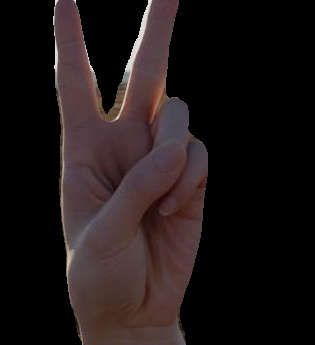

V
1/1 [==============================] - 1s 649ms/step


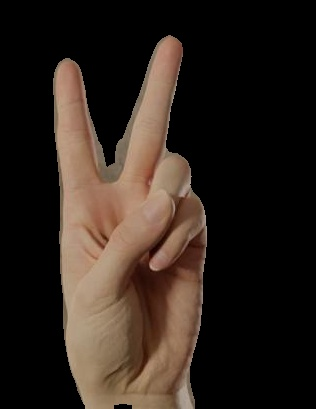

V
1/1 [==============================] - 1s 671ms/step


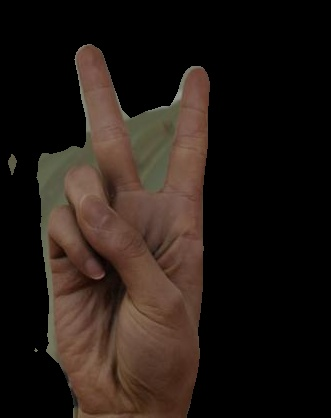

V
1/1 [==============================] - 1s 686ms/step


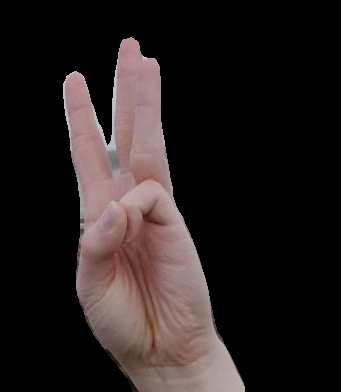

W
1/1 [==============================] - 1s 574ms/step


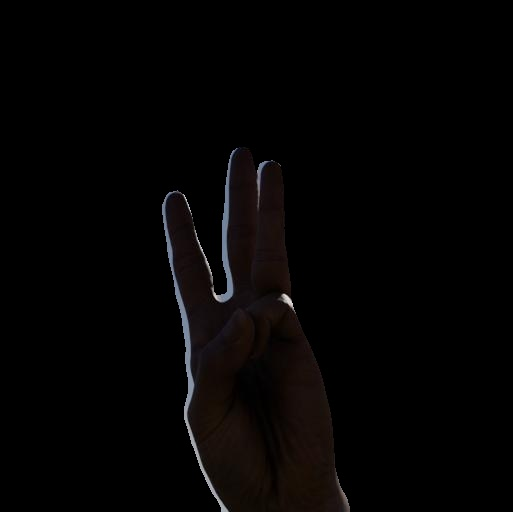

W
1/1 [==============================] - 1s 611ms/step


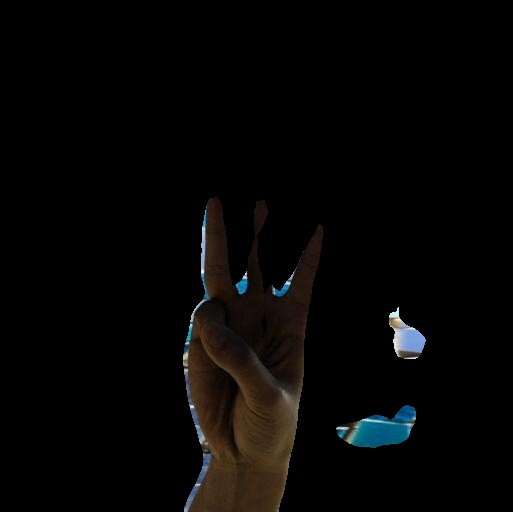

F
1/1 [==============================] - 1s 584ms/step


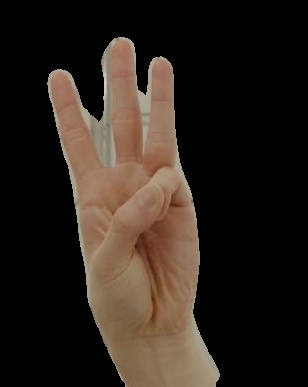

W
1/1 [==============================] - 1s 573ms/step


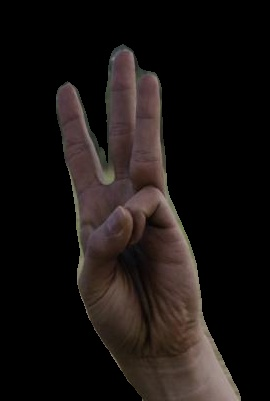

W
1/1 [==============================] - 1s 580ms/step


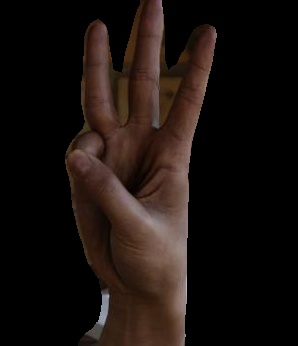

W
1/1 [==============================] - 1s 553ms/step


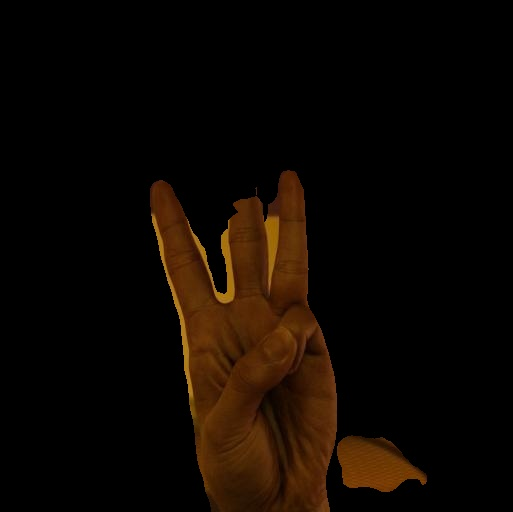

W
1/1 [==============================] - 1s 568ms/step


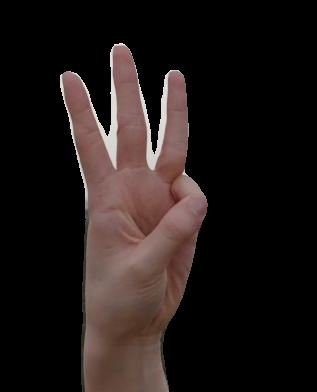

W
1/1 [==============================] - 1s 572ms/step


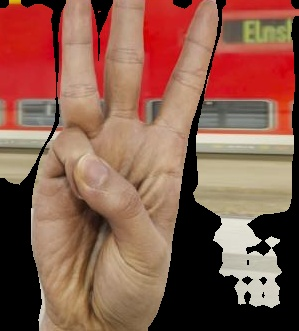

W
1/1 [==============================] - 1s 552ms/step


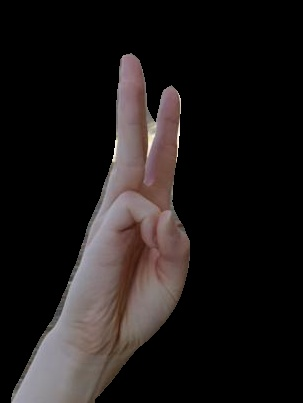

W
1/1 [==============================] - 1s 547ms/step


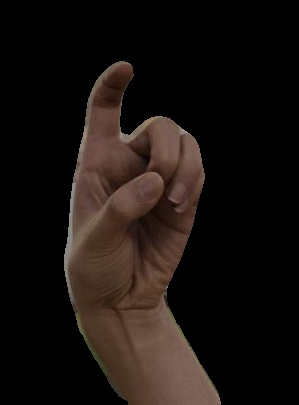

X
1/1 [==============================] - 1s 570ms/step


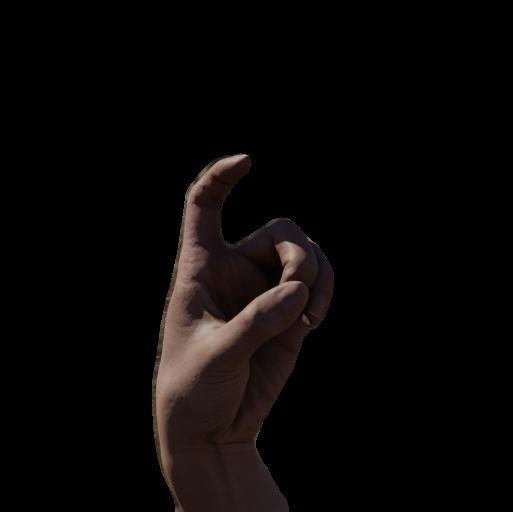

X
1/1 [==============================] - 1s 555ms/step


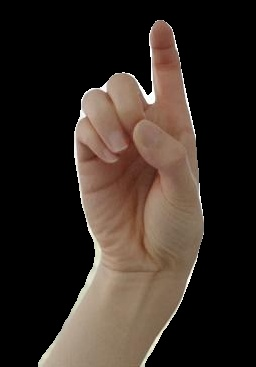

X
1/1 [==============================] - 1s 550ms/step


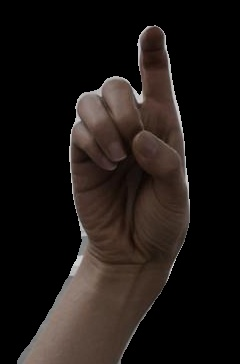

X
1/1 [==============================] - 1s 564ms/step


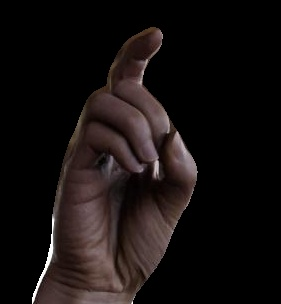

X
1/1 [==============================] - 1s 546ms/step


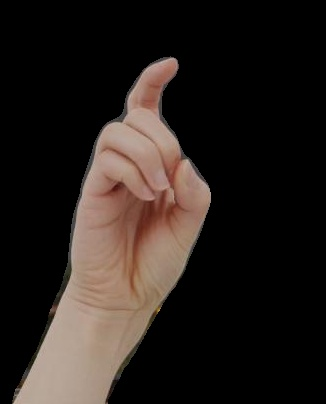

X
1/1 [==============================] - 1s 574ms/step


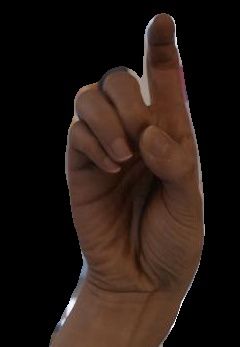

X
1/1 [==============================] - 1s 623ms/step


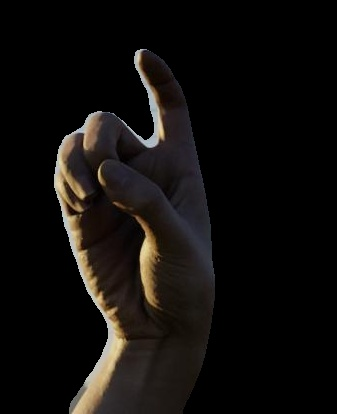

X
1/1 [==============================] - 1s 673ms/step


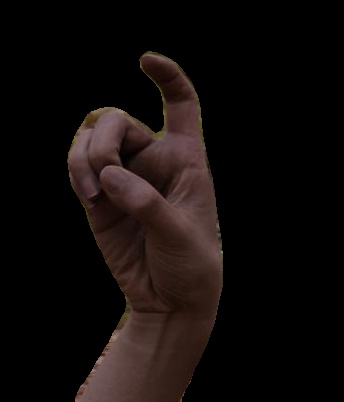

X
1/1 [==============================] - 1s 615ms/step


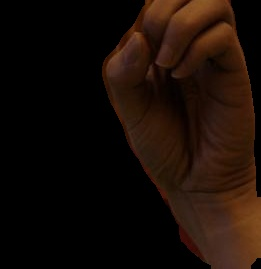

D
1/1 [==============================] - 1s 696ms/step


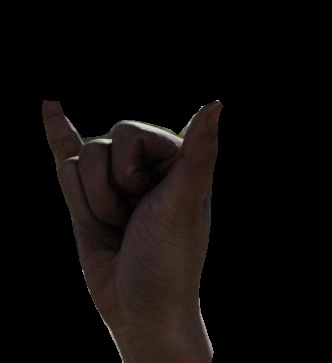

Y
1/1 [==============================] - 1s 635ms/step


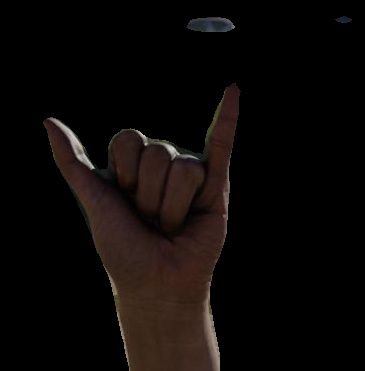

Y
1/1 [==============================] - 1s 572ms/step


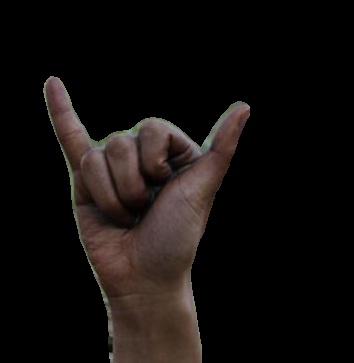

Y
1/1 [==============================] - 1s 581ms/step


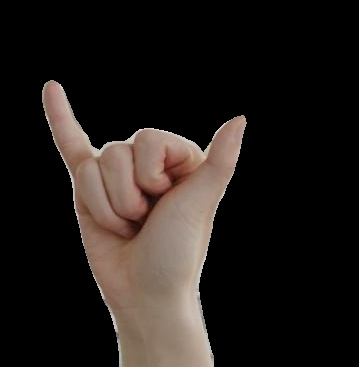

Y
1/1 [==============================] - 1s 562ms/step


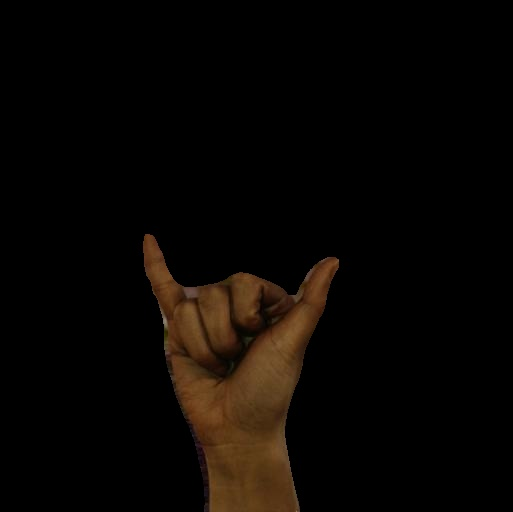

Y
1/1 [==============================] - 1s 542ms/step


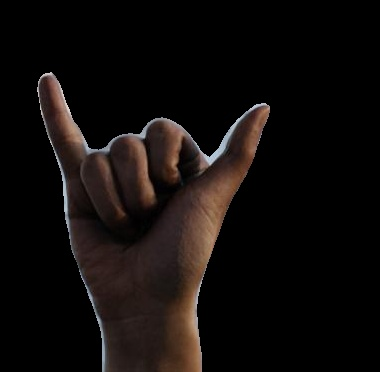

Y
1/1 [==============================] - 1s 541ms/step


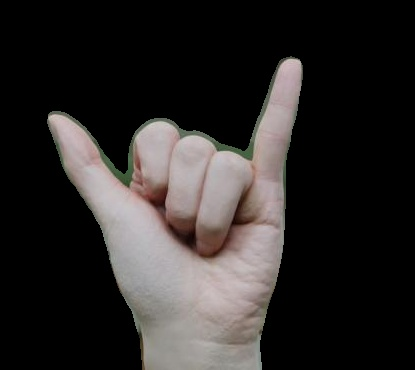

Y
1/1 [==============================] - 1s 577ms/step


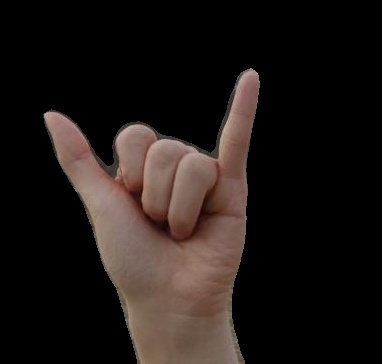

Y
1/1 [==============================] - 1s 576ms/step


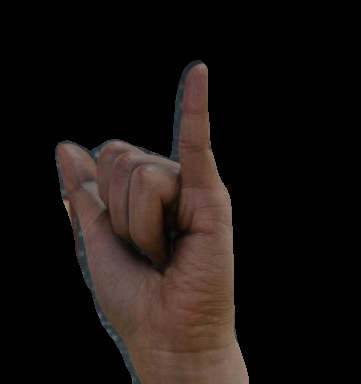

Y
1/1 [==============================] - 1s 563ms/step


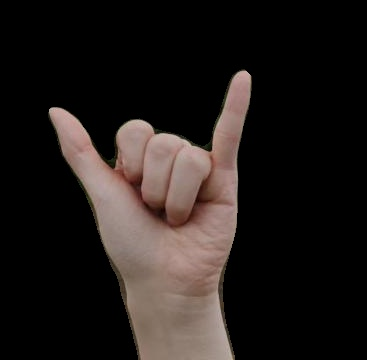

Y
1/1 [==============================] - 1s 574ms/step


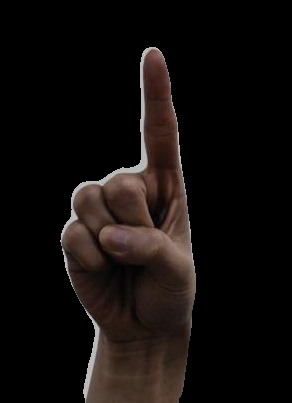

Z
1/1 [==============================] - 1s 551ms/step


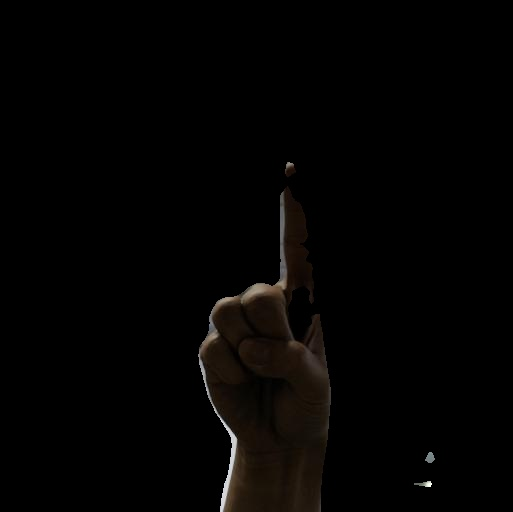

D
1/1 [==============================] - 1s 566ms/step


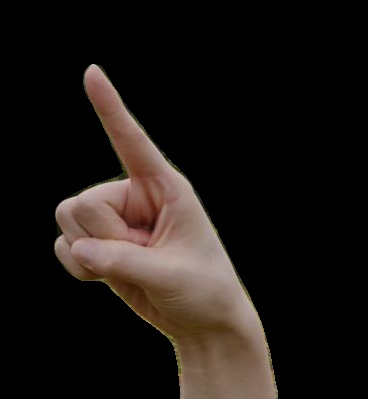

Z
1/1 [==============================] - 1s 584ms/step


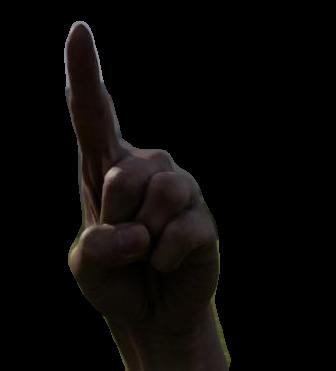

Z
1/1 [==============================] - 1s 554ms/step


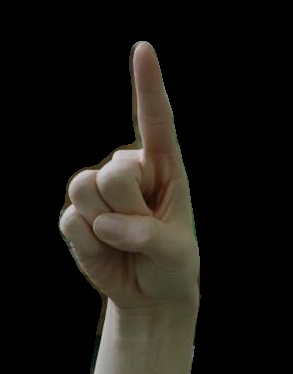

Z
1/1 [==============================] - 1s 570ms/step


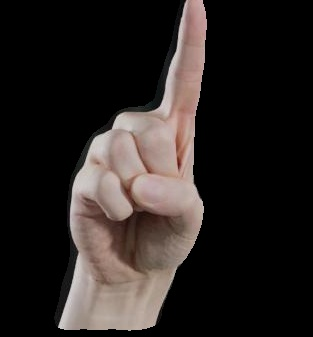

Z
1/1 [==============================] - 1s 607ms/step


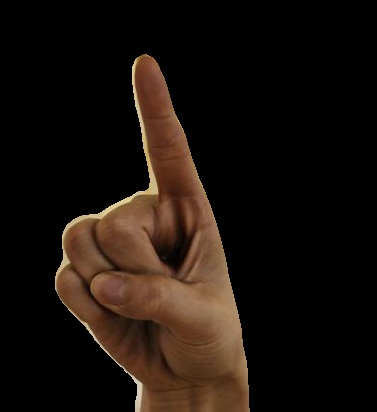

Z
1/1 [==============================] - 1s 576ms/step


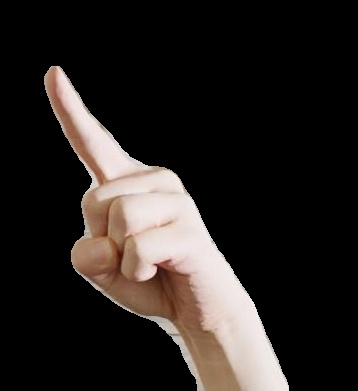

Z
1/1 [==============================] - 1s 725ms/step


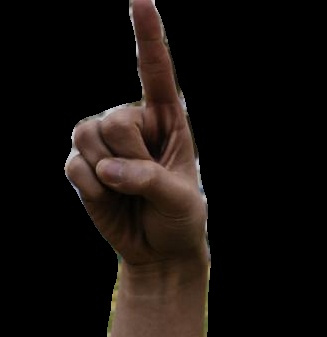

Z
1/1 [==============================] - 1s 641ms/step


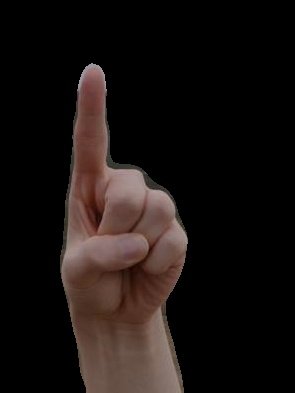

Z


In [ ]:
from tensorflow.keras.models import load_model
import tensorflow
from google.colab.patches import cv2_imshow

model = load_model('/content/resnet101_seg.h5')

predictions = []

# for test_feature in enumerate(test_features):
#     test_feature = tensorflow.expand_dims(test_feature, 0)
#     prediction = model.predict(test_feature)
#     predictions.append(prediction)
features_list = os.listdir("/content/Image-Cropped/test/images")
features_list.sort()
for idx, image in enumerate(features_list):
    test_feature = test_features[idx]
    test_feature = tensorflow.expand_dims(test_feature, 0)
    prediction = model.predict(test_feature)
    ind = np.argmax(prediction[0])

    cv2_imshow(cv2.imread(os.path.join("/content/Image-Cropped/test/images", image)))
    print(chr(ord('A') + ind))